In [1]:
!git clone https://github.com/QCDHUB/jam3dlib.git
!git clone https://github.com/pitonyak25/jam3d_dev_lib.git

Cloning into 'jam3dlib'...
remote: Enumerating objects: 323, done.
remote: Counting objects: 100% (323/323), done.
remote: Compressing objects: 100% (177/177), done.
remote: Total 323 (delta 179), reused 267 (delta 141), pack-reused 0 (from 0)
Receiving objects: 100% (323/323), 4.83 MiB | 4.87 MiB/s, done.
Resolving deltas: 100% (179/179), done.
Cloning into 'jam3d_dev_lib'...
remote: Enumerating objects: 9916, done.
remote: Counting objects: 100% (2844/2844), done.
remote: Compressing objects: 100% (1434/1434), done.
remote: Total 9916 (delta 1411), reused 2843 (delta 1410), pack-reused 7072 (from 1)
Receiving objects: 100% (9916/9916), 940.56 MiB | 10.01 MiB/s, done.
Resolving deltas: 100% (1723/1723), done.
Updating files: 100% (10930/10930), done.


In [ ]:
import os,sys
sys.path.append('/content/jam3d_dev_lib')
sys.path.append('/content/jam3dlib')
os.environ["JAM3D"] = "/content/jam3d_dev_lib"
from tools.tools     import checkdir,save,load,lprint
import tools.config
from tools.config    import load_config, conf
import numpy as np
from tmd import TMD
import matplotlib as plt
import pylab as py
import pandas as pd

In [ ]:
cd jam3dlib

/content/jam3dlib


In [ ]:
tag='JAM3D_2022' #tag for a given analysis (see "List of Fits")
tmd=TMD(tag)

parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

In [ ]:
x=0.1
Q2=10.0
kT=0.1
print(tmd.eval(x,Q2,kT,'p','pdf',0,icol=False))
print(tmd.eval(x,Q2,kT,'p','sivers',0,icol=False))
print(tmd.eval(x,Q2,kT,'p','sivers',0,icol=True))

[7.84175357e+00 3.64503757e+00 5.69564180e-01 2.52804796e+00
 7.06690597e-01 3.31212163e-01 3.31212163e-01 1.26601743e-01
 1.26601743e-01 1.61433295e-04 1.61433295e-04]
[ 0.         -0.54450382  0.          0.87315847  0.          0.
  0.          0.          0.          0.          0.        ]
[ 0.         -0.21872618  0.          0.35074615  0.          0.
  0.          0.          0.          0.          0.        ]


In [ ]:
M = 0.93891897
Mpi = 0.135

In [ ]:
x=0.1
Q2=10.0
kT=0.1
print(tmd.eval(x,Q2,kT,'p','pdf',0,icol=False))
print(tmd.eval(x,Q2,kT,'p','sivers',0,icol=False))
print(tmd.eval(x,Q2,kT,'p','sivers',0,icol=True))

[7.84175357e+00 3.64503757e+00 5.69564180e-01 2.52804796e+00
 7.06690597e-01 3.31212163e-01 3.31212163e-01 1.26601743e-01
 1.26601743e-01 1.61433295e-04 1.61433295e-04]
[ 0.         -0.54450382  0.          0.87315847  0.          0.
  0.          0.          0.          0.          0.        ]
[ 0.         -0.21872618  0.          0.35074615  0.          0.
  0.          0.          0.          0.          0.        ]


In [ ]:
tmd.nrep

465

In [ ]:
x=0.1
Q2=10.0
kT=0.1
irep = 0 # this one can be varied in order to create multiple images
def plot_function_u(irep,x,Q2,kTx,kTy):
  kT = np.sqrt(kTx**2 + kTy**2)
  return tmd.eval(x,Q2,kT,'p','pdf',irep,icol=False)[1] - kTx/M * tmd.eval(x,Q2,kT,'p','sivers',irep,icol=False)[1]
kTx,kTy = 0.1,0.1
print(plot_function_u(irep,x,Q2,kTx,kTy))

3.628931235248452


(32, 32, 9)


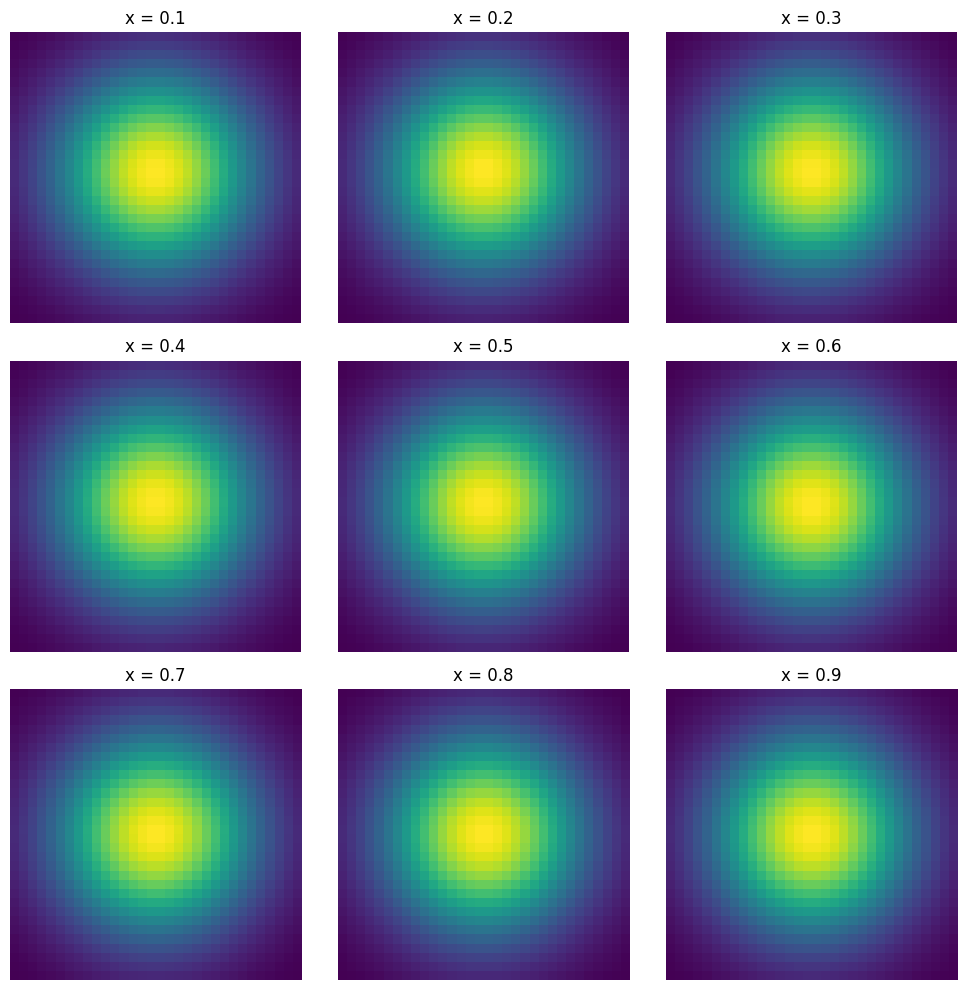

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

from matplotlib.colors import Normalize
import matplotlib.cm as cm

kTx = np.linspace(-1,1,32)
kTy = np.linspace(-1,1,32)
X, Y = np.meshgrid(kTx, kTy)

Z=[]
x = 0.1
Q2 = 10
irep = 0 # this can be changed to produce replicas of images, can be from 0 to 465
for kx in kTx:
  Z1 = []
  for ky in kTy:
        Z2 = []
        for x in range(1,10):
            Z2.append(plot_function_u(irep, x/10, Q2, kx, ky))
        Z1.append(Z2)
  Z.append(Z1)
ND = np.array(Z)
print(ND.shape)
# Plotting 2D slices
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
for i in range(3):
    for j in range(3):
        ax = axs[i, j]
        ax.imshow(ND[:, :, i*3+j], cmap='viridis', interpolation='nearest', origin='lower')
        ax.set_title(f'x = {(i*3+j+1)/10}')
        ax.axis('off')
plt.tight_layout()
plt.show()
# example = plt.imshow(ND[:, :, 0], cmap='viridis', interpolation='none', origin='lower')
# print(example.shape)

In [ ]:
contour graph

<ipython-input-11-9414a4995f6f>:66: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


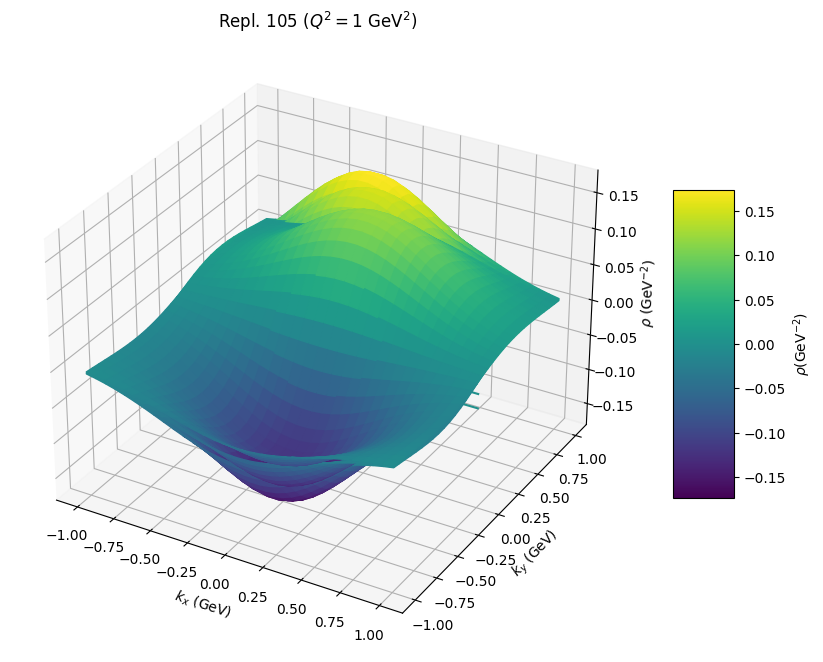

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# # Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# # Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    # return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False)
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.02*i, cmap='viridis')

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

plt.show()


<ipython-input-39-256256fcd72c>:58: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


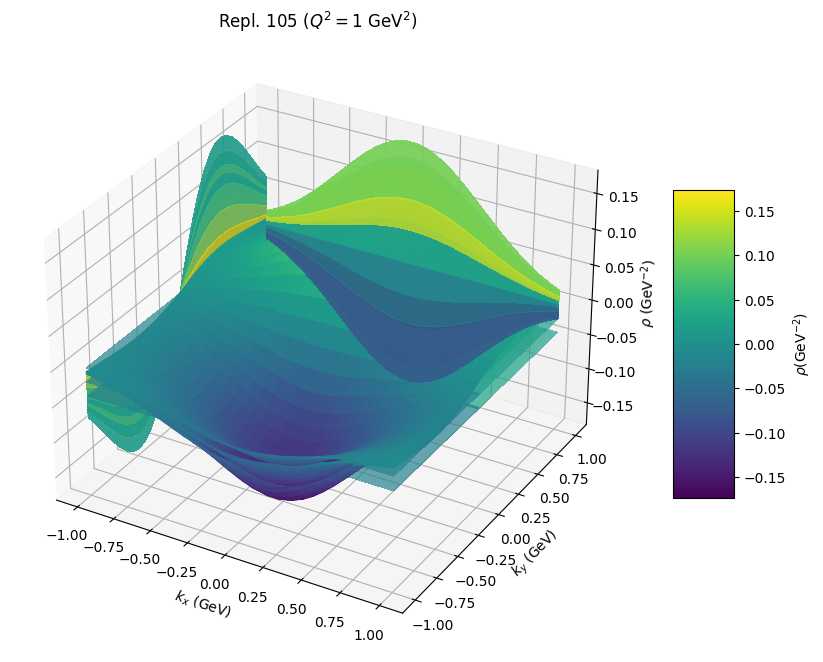

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # Adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False)
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.02*i, cmap='viridis')

# Adding 2D projections
for i, x in enumerate(x_values):
    ax.contourf(X, Y, Z[i], zdir='z', offset=-0.02*i, cmap='viridis', alpha=0.7)
    ax.contourf(X, Y, Z[i], zdir='x', offset=-1.0, cmap='viridis', alpha=0.7)
    ax.contourf(X, Y, Z[i], zdir='y', offset=1.0, cmap='viridis', alpha=0.7)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

plt.show()


<ipython-input-40-d1ad5719fdf1>:58: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


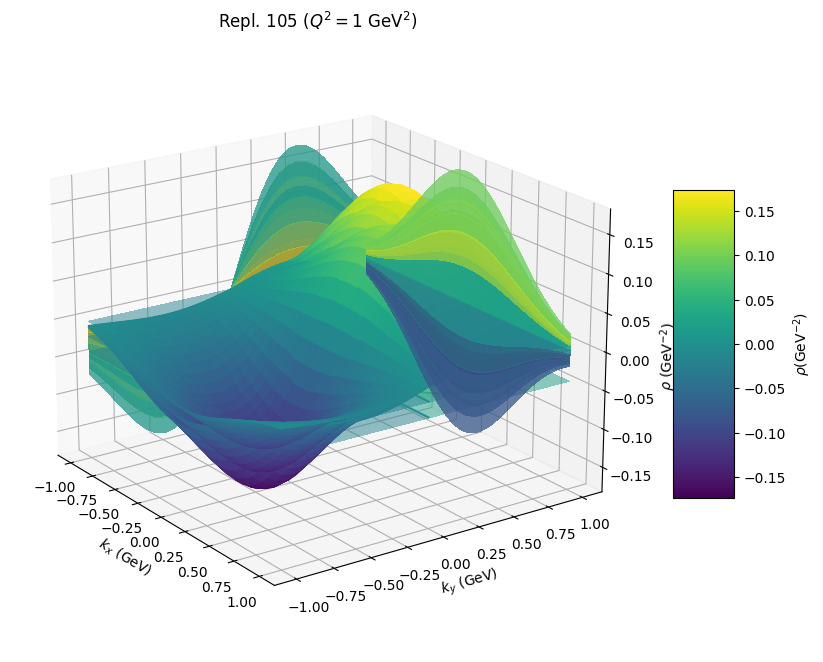

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # Adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False)
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.02*i, cmap='viridis')

# Adding 2D projections
for i, x in enumerate(x_values):
    ax.contourf(X, Y, Z[i], zdir='z', offset=-0.02*i, cmap='viridis', alpha=0.5)
    ax.contourf(X, Y, Z[i], zdir='x', offset=-1.0, cmap='viridis', alpha=0.5)
    ax.contourf(X, Y, Z[i], zdir='y', offset=1.0, cmap='viridis', alpha=0.5)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

# Setting the view angle for better visualization
ax.view_init(elev=20, azim=-35)

plt.show()


<ipython-input-52-8690eb484439>:60: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



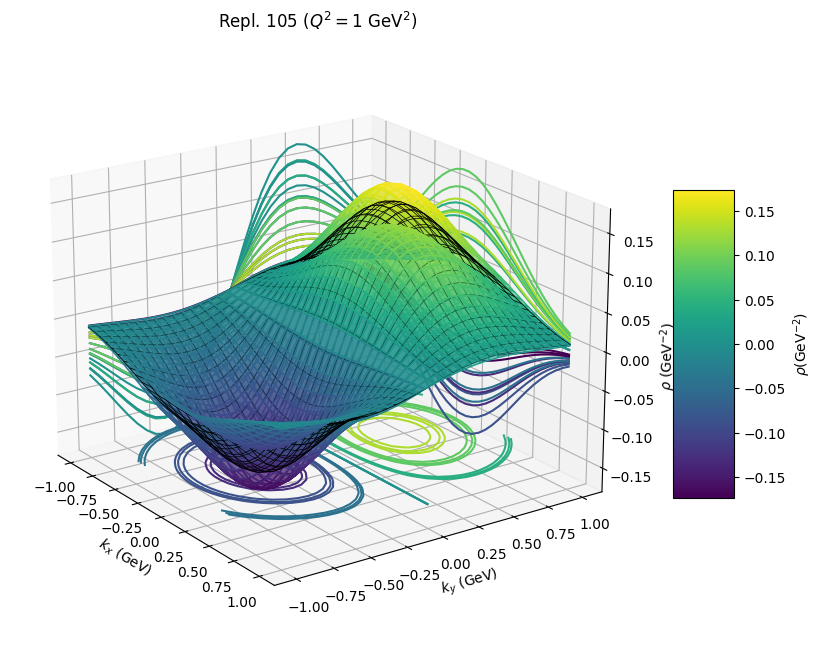

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # Adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False, alpha=0.5)

# Adding mesh plot for the original 3D surface
ax.plot_wireframe(X, Y, Z[1], color='black', linewidth=0.5)

# Adding 2D projections
for i, x in enumerate(x_values):
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.15, cmap='viridis')
    ax.contour(X, Y, Z[i], zdir='x', offset=-1.0, cmap='viridis')
    ax.contour(X, Y, Z[i], zdir='y', offset=1.0, cmap='viridis')

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

# Setting the view angle for better visualization
ax.view_init(elev=20, azim=-35)

plt.show()


In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.graph_objects as go
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # Adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Creating the mesh plot for Plotly
fig = go.Figure()

# Plotting the 3D surface with wireframe
fig.add_trace(go.Surface(z=Z[1], x=kTx, y=kTy, colorscale='Viridis', showscale=False))

# Adding 2D projections as contour plots
fig.add_trace(go.Contour(z=Z[1], x=kTx, y=kTy, colorscale='Viridis', showscale=False, contours=dict(start=Z.min(), end=Z.max(), size=0.01), opacity=0.5))

# Setting layout for better visualization
fig.update_layout(
    title='Repl. 105 ($Q^2=1$ GeV$^2$)',
    scene=dict(
        xaxis_title='$k_x$ (GeV)',
        yaxis_title='$k_y$ (GeV)',
        zaxis_title='$\\rho$ (GeV$^{-2}$)',
        aspectratio=dict(x=1, y=1, z=0.5),
    )
)

# Show the plot
fig.show()


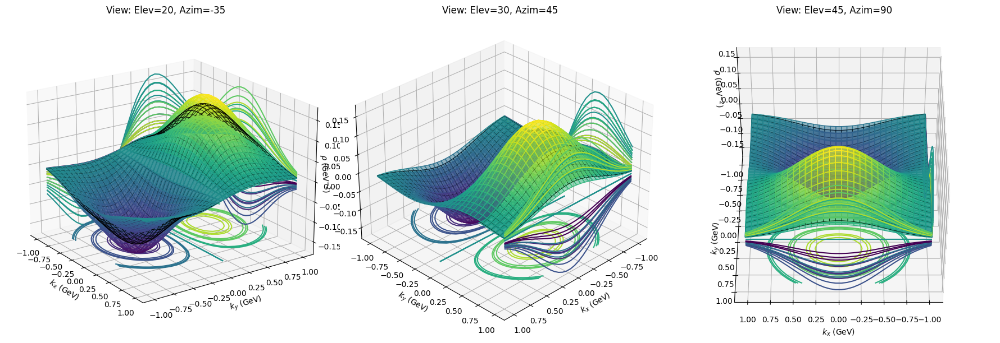

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # Adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Define the view angles to use
view_angles = [
    {'elev': 20, 'azim': -35},
    {'elev': 30, 'azim': 45},
    {'elev': 45, 'azim': 90},
]

# Create subplots for different viewing angles
fig, axes = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': '3d'})

for ax, angle in zip(axes, view_angles):
    # Plotting the data
    for i, x in enumerate(x_values):
        ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=cm.viridis(Normalize(vmin=Z.min(), vmax=Z.max())(Z[i])), shade=False, alpha=0.5)

    # Adding mesh plot for the original 3D surface
    ax.plot_wireframe(X, Y, Z[1], color='black', linewidth=0.5)

    # Adding 2D projections
    for i, x in enumerate(x_values):
        ax.contour(X, Y, Z[i], zdir='z', offset=-0.15, cmap='viridis')
        ax.contour(X, Y, Z[i], zdir='x', offset=-1.0, cmap='viridis')
        ax.contour(X, Y, Z[i], zdir='y', offset=1.0, cmap='viridis')

    # Labels and title
    ax.set_xlabel(r'$k_x$ (GeV)')
    ax.set_ylabel(r'$k_y$ (GeV)')
    ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
    ax.set_title(f"View: Elev={angle['elev']}, Azim={angle['azim']}")

    # Setting the view angle for better visualization
    ax.view_init(elev=angle['elev'], azim=angle['azim'])

# Adjust layout for better viewing
plt.tight_layout()
plt.show()


<ipython-input-27-8157bcad9daa>:60: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



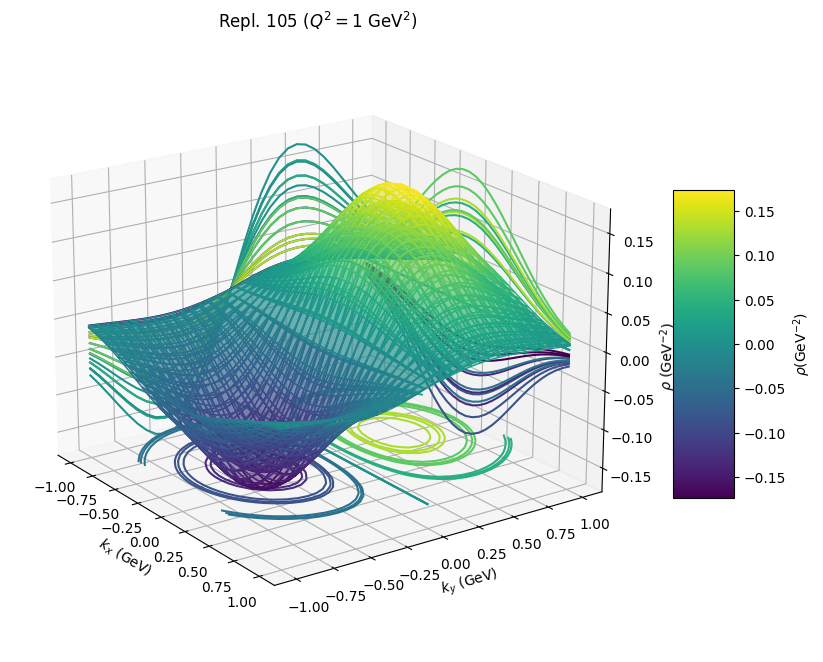

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # Adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Adding mesh plot for the original 3D surface
ax.plot_wireframe(X, Y, Z[1], color='black', linewidth=0.5)

# Adding 2D projections with color
for i, x in enumerate(x_values):
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.15, cmap='viridis')
    ax.contour(X, Y, Z[i], zdir='x', offset=-1.0, cmap='viridis')
    ax.contour(X, Y, Z[i], zdir='y', offset=1.0, cmap='viridis')

# Adding surface plot with transparent faces
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False, alpha=0.3)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

# Setting the view angle for better visualization
ax.view_init(elev=20, azim=-35)

plt.show()


 cord space momentum on 1 side and
 sphere

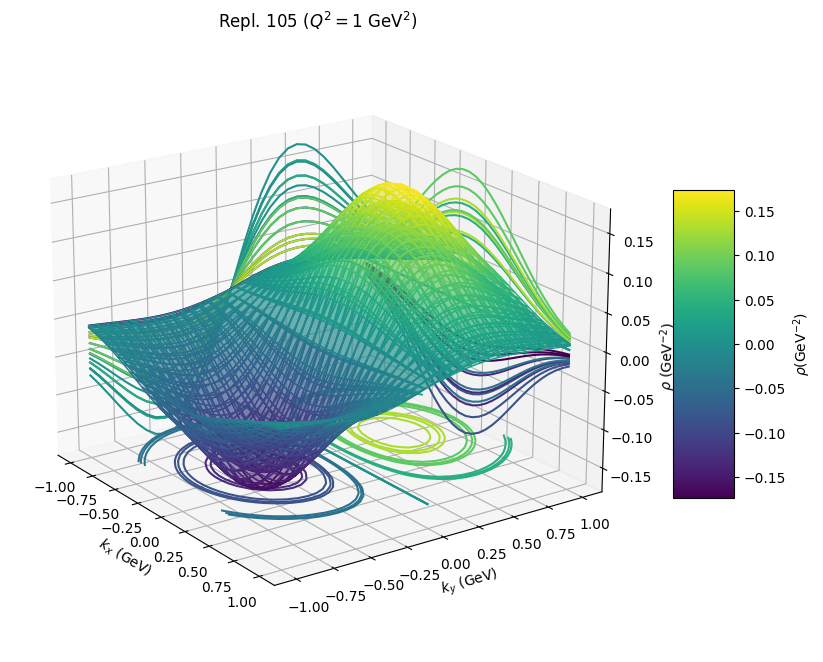

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # Adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Adding mesh plot for the original 3D surface
ax.plot_wireframe(X, Y, Z[1], color='black', linewidth=0.5)

# Adding 2D projections with color
for i, x in enumerate(x_values):
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.15, cmap='viridis')
    ax.contour(X, Y, Z[i], zdir='x', offset=-1.0, cmap='viridis')
    ax.contour(X, Y, Z[i], zdir='y', offset=1.0, cmap='viridis')

# Adding surface plot with transparent faces
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False, alpha=0.3)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, ax=ax, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

# Setting the view angle for better visualization
ax.view_init(elev=20, azim=-35)

plt.show()


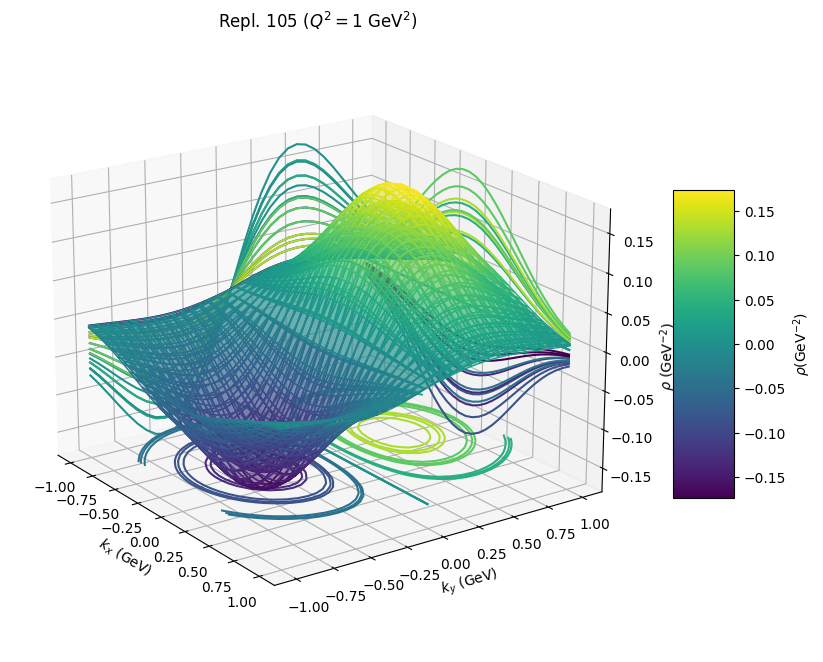

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # Adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Adding mesh plot for the original 3D surface
ax.plot_wireframe(X, Y, Z[1], color='black', linewidth=0.5)

# Adding 2D projections with color
for i, x in enumerate(x_values):
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.15, cmap='viridis')
    ax.contour(X, Y, Z[i], zdir='x', offset=-1.0, cmap='viridis')
    ax.contour(X, Y, Z[i], zdir='y', offset=1.0, cmap='viridis')

# Adding surface plot with transparent faces
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False, alpha=0.3)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, ax=ax, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

# Setting the view angle for better visualization
ax.view_init(elev=20, azim=-35)

plt.show()


<ipython-input-18-4dd2a2c51126>:69: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



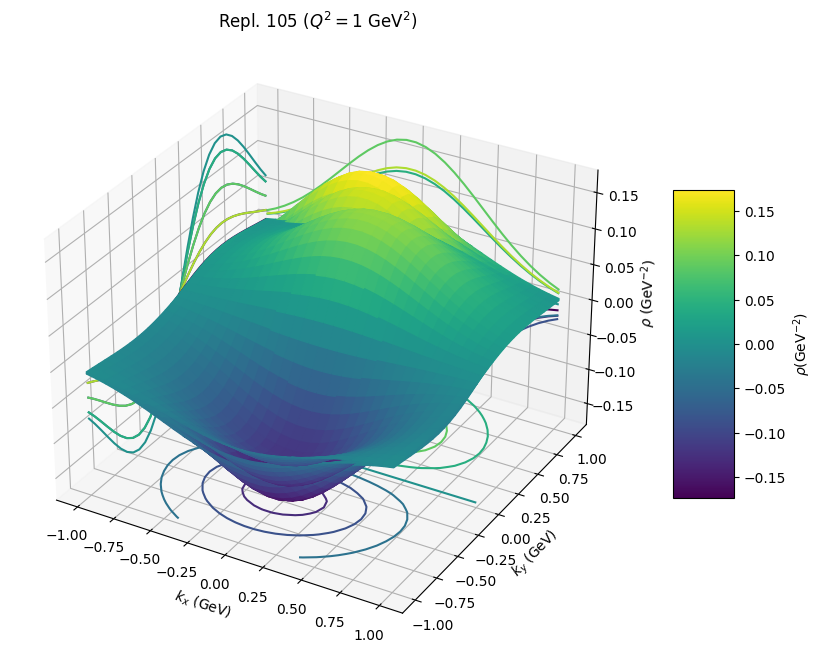

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False)

# Adding projections on all sides
ax.contour(X, Y, Z[0], zdir='z', offset=Z[0].min(), cmap='viridis')  # Bottom projection
ax.contour(X, Y, Z[0], zdir='x', offset=X.min(), cmap='viridis')  # Side projection (X-axis)
ax.contour(X, Y, Z[0], zdir='y', offset=Y.max(), cmap='viridis')  # Side projection (Y-axis)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

plt.show()


<ipython-input-19-d4fb6feec989>:69: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



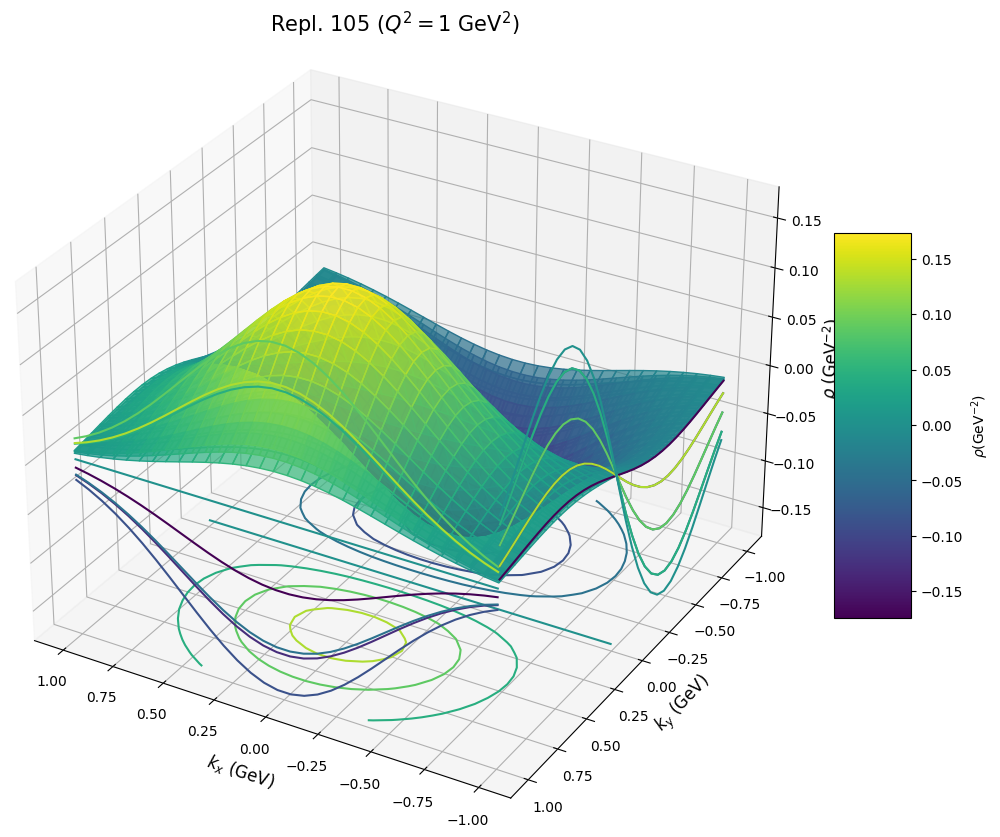

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False, alpha=0.7)

# Adding projections on all sides
ax.contour(X, Y, Z[0], zdir='z', offset=Z[0].min(), cmap='viridis', linestyles="solid")  # Bottom projection
ax.contour(X, Y, Z[0], zdir='x', offset=X.min(), cmap='viridis', linestyles="solid")  # Side projection (X-axis)
ax.contour(X, Y, Z[0], zdir='y', offset=Y.max(), cmap='viridis', linestyles="solid")  # Side projection (Y-axis)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)', fontsize=12)
ax.set_ylabel(r'$k_y$ (GeV)', fontsize=12)
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)', fontsize=12)
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)', fontsize=15)

# Adjusting the view angle for better perspective
ax.view_init(elev=30, azim=120)

# Set projection type to 'persp' (perspective)
ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([1.1, 1.1, 1.1, 1]))

plt.show()


<ipython-input-17-94b42f2a1303>:69: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


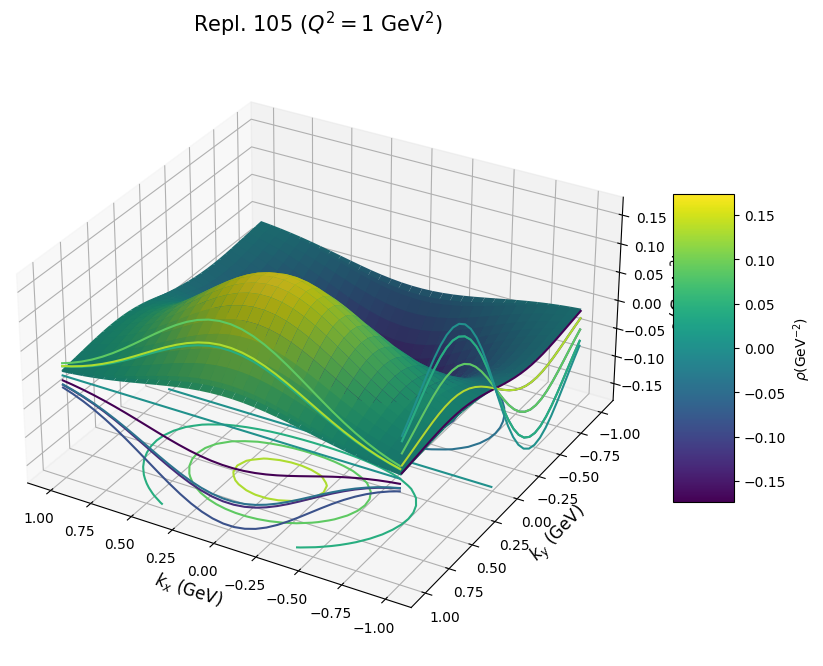

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=True, edgecolor='none')

# Adding projections on all sides
ax.contour(X, Y, Z[0], zdir='z', offset=Z[0].min(), cmap='viridis', linestyles="solid")  # Bottom projection
ax.contour(X, Y, Z[0], zdir='x', offset=X.min(), cmap='viridis', linestyles="solid")  # Side projection (X-axis)
ax.contour(X, Y, Z[0], zdir='y', offset=Y.max(), cmap='viridis', linestyles="solid")  # Side projection (Y-axis)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)', fontsize=12)
ax.set_ylabel(r'$k_y$ (GeV)', fontsize=12)
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)', fontsize=12)
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)', fontsize=15)

# Adjusting the view angle for better perspective
ax.view_init(elev=30, azim=120)

# Set projection type to 'persp' (perspective)
ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([1.1, 1.1, 0.8, 1]))

plt.show()


<ipython-input-18-577a94afaa1b>:69: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


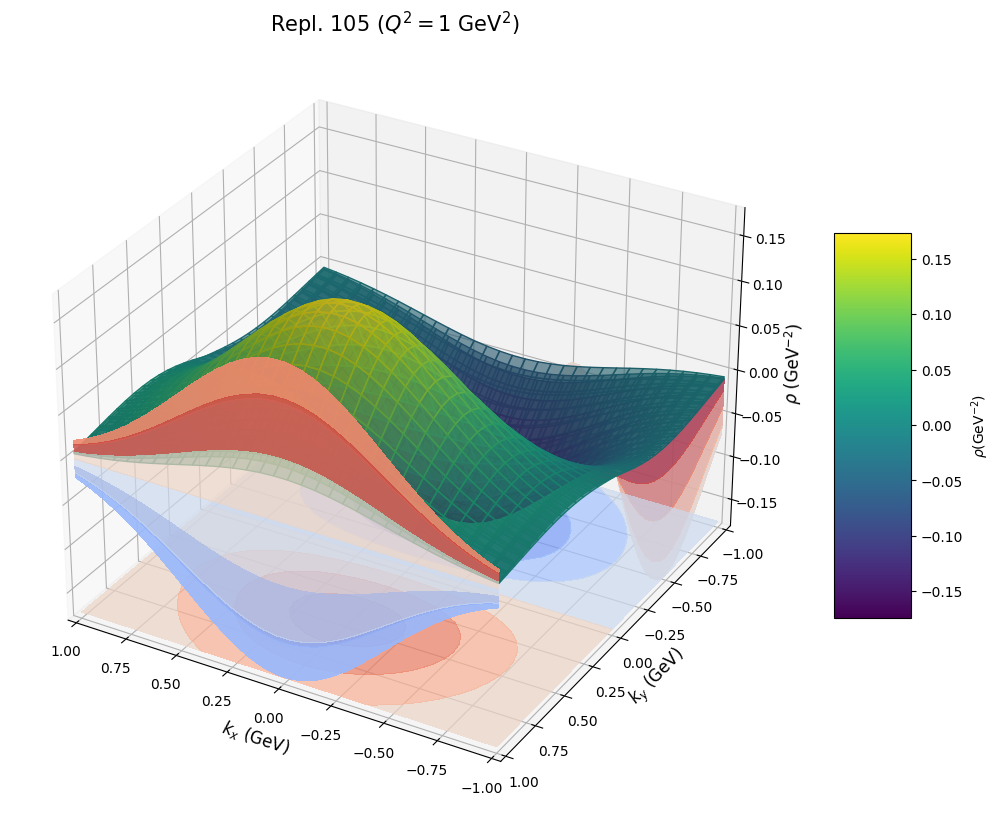

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=True, alpha=0.6)

# Adding filled contour projections on all sides
ax.contourf(X, Y, Z[0], zdir='z', offset=Z[0].min(), cmap=cm.coolwarm, alpha=0.7)  # Bottom projection
ax.contourf(X, Y, Z[0], zdir='x', offset=X.min(), cmap=cm.coolwarm, alpha=0.7)  # Side projection (X-axis)
ax.contourf(X, Y, Z[0], zdir='y', offset=Y.max(), cmap=cm.coolwarm, alpha=0.7)  # Side projection (Y-axis)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)', fontsize=12)
ax.set_xlim([-1, 1])
ax.set_ylabel(r'$k_y$ (GeV)', fontsize=12)
ax.set_ylim([-1, 1])
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)', fontsize=12)
ax.set_zlim([Z[0].min(), Z[0].max()])
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)', fontsize=15)

# Adjusting the view angle for better perspective
ax.view_init(elev=30, azim=120)

plt.show()


<ipython-input-19-1e0a0c0409f5>:74: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


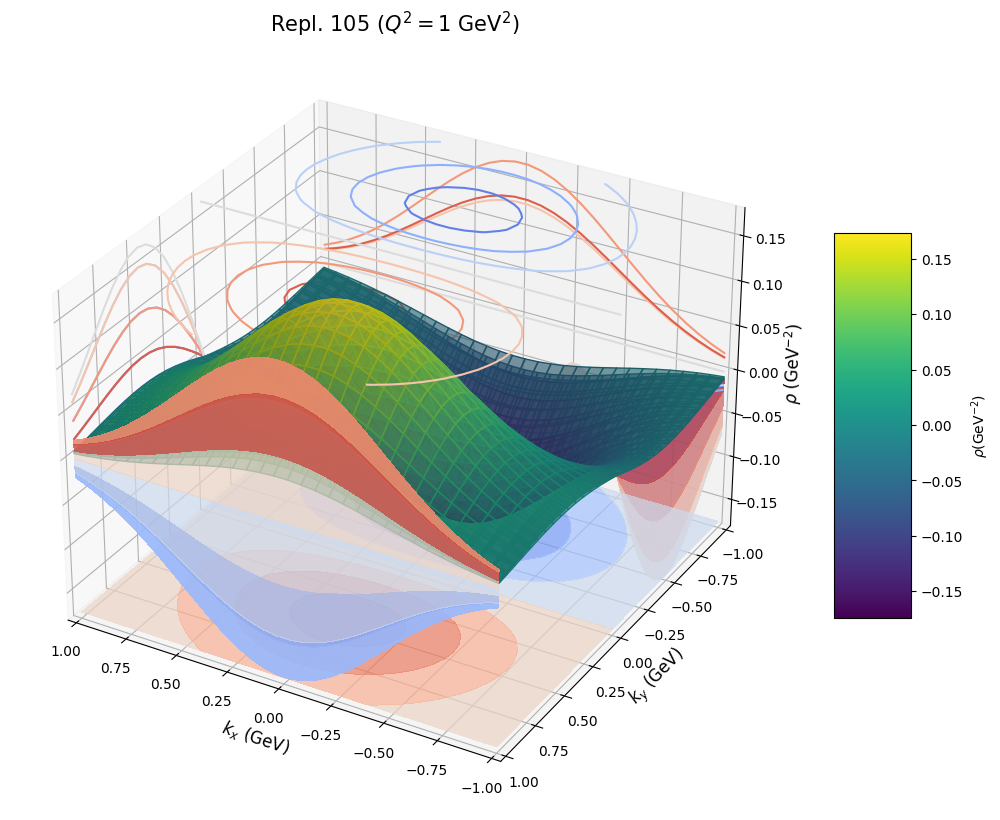

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=True, alpha=0.6)

# Adding filled contour projections on all sides
ax.contourf(X, Y, Z[0], zdir='z', offset=Z[0].min(), cmap=cm.coolwarm, alpha=0.7)  # Bottom projection
ax.contourf(X, Y, Z[0], zdir='x', offset=X.min(), cmap=cm.coolwarm, alpha=0.7)  # Side projection (X-axis)
ax.contourf(X, Y, Z[0], zdir='y', offset=Y.max(), cmap=cm.coolwarm, alpha=0.7)  # Side projection (Y-axis)

# Adding line contour projections on the opposite sides
ax.contour(X, Y, Z[0], zdir='z', offset=Z[0].max(), cmap=cm.coolwarm, linestyles="solid")  # Top projection
ax.contour(X, Y, Z[0], zdir='x', offset=X.max(), cmap=cm.coolwarm, linestyles="solid")  # Opposite side projection (X-axis)
ax.contour(X, Y, Z[0], zdir='y', offset=Y.min(), cmap=cm.coolwarm, linestyles="solid")  # Opposite side projection (Y-axis)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)', fontsize=12)
ax.set_xlim([-1, 1])
ax.set_ylabel(r'$k_y$ (GeV)', fontsize=12)
ax.set_ylim([-1, 1])
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)', fontsize=12)
ax.set_zlim([Z[0].min(), Z[0].max()])
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)', fontsize=15)

# Adjusting the view angle for better perspective
ax.view_init(elev=30, azim=120)

plt.show()


<ipython-input-20-9b10371056ae>:75: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


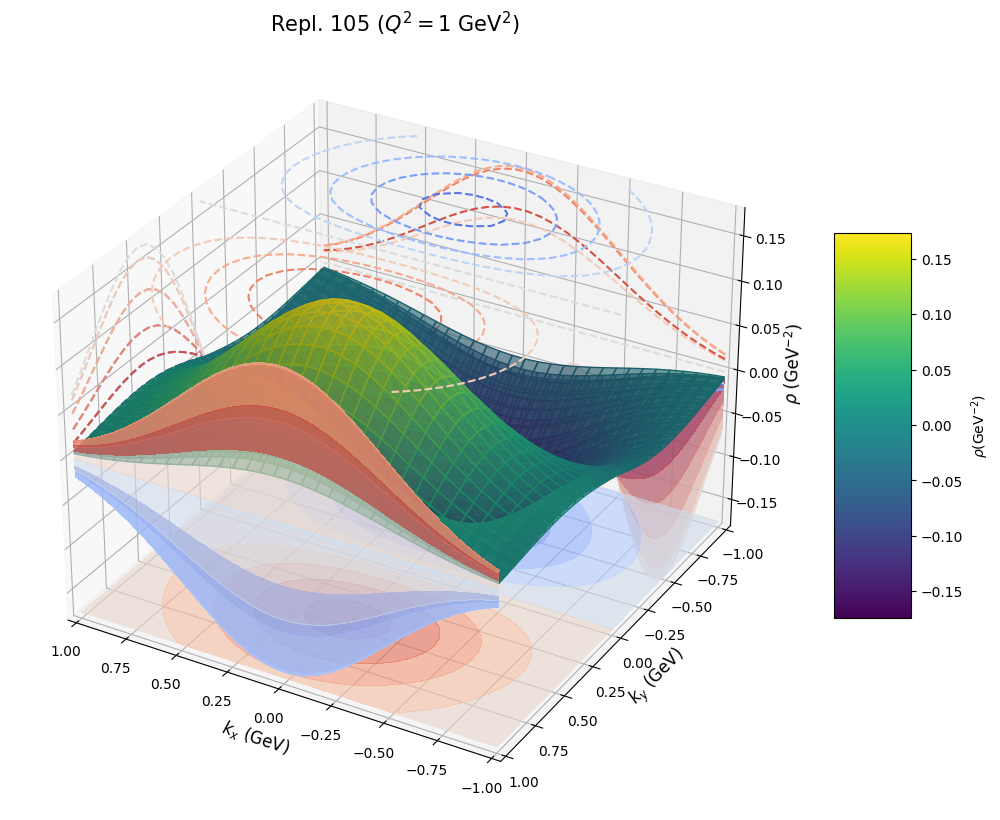

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=True, alpha=0.6)

# Adding filled contour projections on all sides
contour_levels = 10
ax.contourf(X, Y, Z[0], zdir='z', offset=Z[0].min(), cmap=cm.coolwarm, alpha=0.6, levels=contour_levels)  # Bottom projection
ax.contourf(X, Y, Z[0], zdir='x', offset=X.min(), cmap=cm.coolwarm, alpha=0.6, levels=contour_levels)  # Side projection (X-axis)
ax.contourf(X, Y, Z[0], zdir='y', offset=Y.max(), cmap=cm.coolwarm, alpha=0.6, levels=contour_levels)  # Side projection (Y-axis)

# Adding line contour projections on the opposite sides
ax.contour(X, Y, Z[0], zdir='z', offset=Z[0].max(), cmap=cm.coolwarm, linestyles="dashed", levels=contour_levels)  # Top projection
ax.contour(X, Y, Z[0], zdir='x', offset=X.max(), cmap=cm.coolwarm, linestyles="dashed", levels=contour_levels)  # Opposite side projection (X-axis)
ax.contour(X, Y, Z[0], zdir='y', offset=Y.min(), cmap=cm.coolwarm, linestyles="dashed", levels=contour_levels)  # Opposite side projection (Y-axis)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)', fontsize=12)
ax.set_xlim([-1, 1])
ax.set_ylabel(r'$k_y$ (GeV)', fontsize=12)
ax.set_ylim([-1, 1])
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)', fontsize=12)
ax.set_zlim([Z[0].min(), Z[0].max()])
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)', fontsize=15)

# Adjusting the view angle for better perspective
ax.view_init(elev=30, azim=120)

plt.show()


<ipython-input-21-67df838a3e6a>:75: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


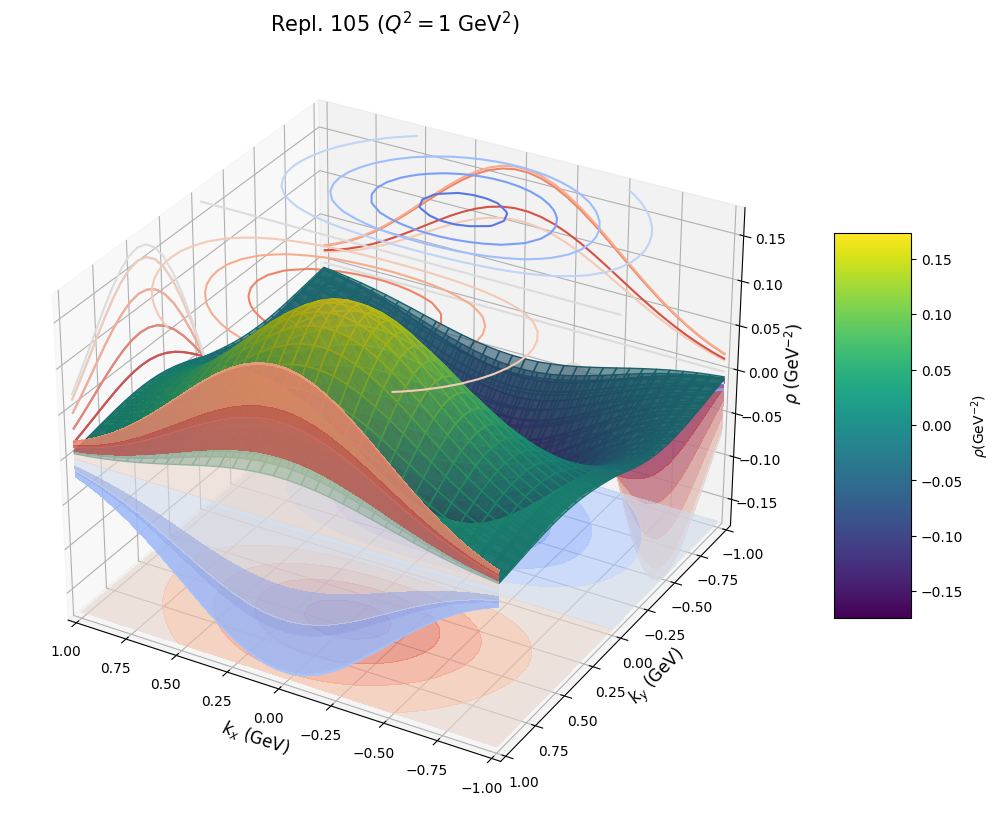

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=True, alpha=0.6)

# Adding filled contour projections on all sides
contour_levels = 10
ax.contourf(X, Y, Z[0], zdir='z', offset=Z[0].min(), cmap=cm.coolwarm, alpha=0.6, levels=contour_levels)  # Bottom projection
ax.contourf(X, Y, Z[0], zdir='x', offset=X.min(), cmap=cm.coolwarm, alpha=0.6, levels=contour_levels)  # Side projection (X-axis)
ax.contourf(X, Y, Z[0], zdir='y', offset=Y.max(), cmap=cm.coolwarm, alpha=0.6, levels=contour_levels)  # Side projection (Y-axis)

# Adding line contour projections on the opposite sides
ax.contour(X, Y, Z[0], zdir='z', offset=Z[0].max(), cmap=cm.coolwarm, linestyles="solid", levels=contour_levels)  # Top projection
ax.contour(X, Y, Z[0], zdir='x', offset=X.max(), cmap=cm.coolwarm, linestyles="solid", levels=contour_levels)  # Opposite side projection (X-axis)
ax.contour(X, Y, Z[0], zdir='y', offset=Y.min(), cmap=cm.coolwarm, linestyles="solid", levels=contour_levels)  # Opposite side projection (Y-axis)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)', fontsize=12)
ax.set_xlim([-1, 1])
ax.set_ylabel(r'$k_y$ (GeV)', fontsize=12)
ax.set_ylim([-1, 1])
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)', fontsize=12)
ax.set_zlim([Z[0].min(), Z[0].max()])
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)', fontsize=15)

# Adjusting the view angle for better perspective
ax.view_init(elev=30, azim=120)

plt.show()


<ipython-input-22-8a0ea1c2c06a>:75: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


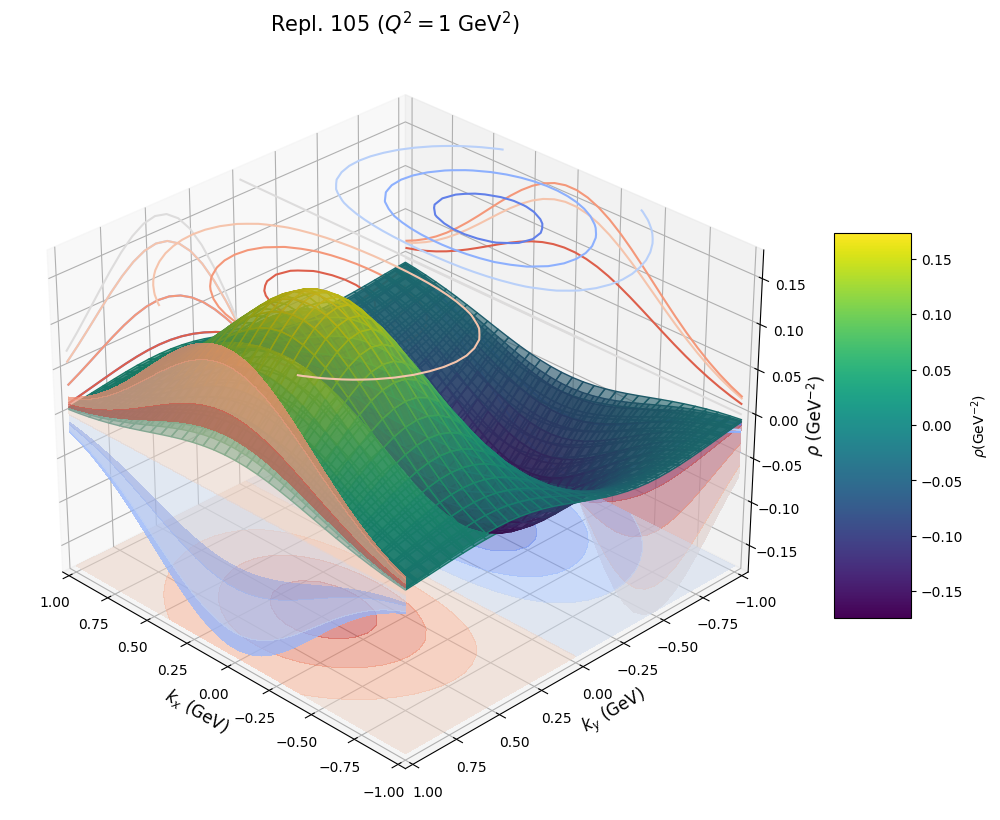

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=True, alpha=0.6)

# Adding filled contour projections on all sides
contour_levels = 6  # Reduced the number of contour levels
ax.contourf(X, Y, Z[0], zdir='z', offset=Z[0].min(), cmap=cm.coolwarm, alpha=0.5, levels=contour_levels)  # Bottom projection
ax.contourf(X, Y, Z[0], zdir='x', offset=X.min(), cmap=cm.coolwarm, alpha=0.5, levels=contour_levels)  # Side projection (X-axis)
ax.contourf(X, Y, Z[0], zdir='y', offset=Y.max(), cmap=cm.coolwarm, alpha=0.5, levels=contour_levels)  # Side projection (Y-axis)

# Adding line contour projections on the opposite sides
ax.contour(X, Y, Z[0], zdir='z', offset=Z[0].max(), cmap=cm.coolwarm, linestyles="solid", levels=contour_levels)  # Top projection
ax.contour(X, Y, Z[0], zdir='x', offset=X.max(), cmap=cm.coolwarm, linestyles="solid", levels=contour_levels)  # Opposite side projection (X-axis)
ax.contour(X, Y, Z[0], zdir='y', offset=Y.min(), cmap=cm.coolwarm, linestyles="solid", levels=contour_levels)  # Opposite side projection (Y-axis)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)', fontsize=12)
ax.set_xlim([-1, 1])
ax.set_ylabel(r'$k_y$ (GeV)', fontsize=12)
ax.set_ylim([-1, 1])
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)', fontsize=12)
ax.set_zlim([Z[0].min(), Z[0].max()])
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)', fontsize=15)

# Adjusting the view angle for better perspective
ax.view_init(elev=30, azim=135)

plt.show()


rho value as a function of kx.
Projections with perspective: https://matplotlib.org/stable/gallery/mplot3d/projections.html

Side 2 d projections: https://stackoverflow.com/questions/19676058/python-2d-perspective-projection-of-a-3d-surface-plot
Stack OverflowStack Overflow
python : 2D perspective projection of a 3D surface plot
I am making a 3D surface plot using matplotlib (python). I want to visualize the shadow (2D perspective projection) of the 3D surface on xy xz and yz surface.
In matlab, SHADOWPLOT does the needed...

<ipython-input-14-eb65f4442d07>:66: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



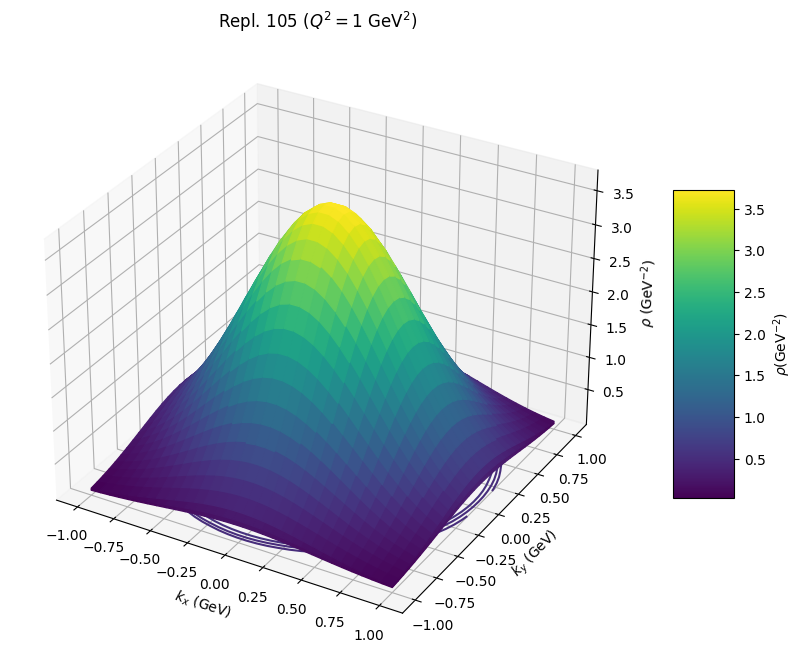

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# # Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# # Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]
    # return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False)
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.02*i, cmap='viridis')

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

plt.show()

parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

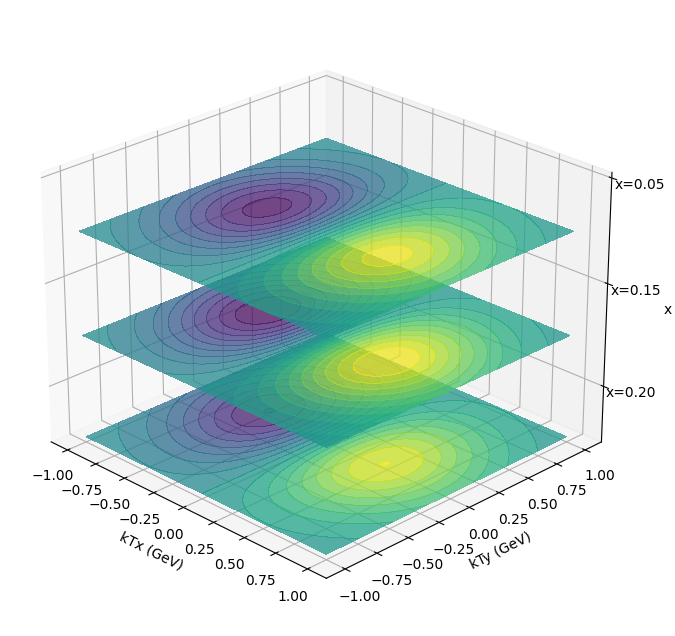

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    # return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx/M * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.15, 0.20]

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Adjust this value to increase or decrease the space between layers
layer_distance = 1.5
offsets = np.arange(0, layer_distance * len(x_values), layer_distance)

for x, offset in zip(x_values, offsets):
    Z = np.array([[plot_function_u(x, 1, tx, ty) for tx, ty in zip(ktx, kty)] for ktx, kty in zip(X, Y)])
    ax.contourf(X, Y, Z + offset, zdir='z', offset=-offset, cmap=cm.viridis, levels=20, alpha=0.75)

# Setting the limits and labels for better clarity and visibility
ax.set_xlabel('kTx (GeV)')
ax.set_ylabel('kTy (GeV)')
ax.set_zlabel('x')
ax.set_zlim(-max(offsets), 0)

# Align the ticks to the middle of each slice
ax.set_zticks(-offsets + layer_distance / 2)
ax.set_zticklabels([f"x={x_val:.2f}" for x_val in x_values])

# Optimal view
ax.view_init(elev=25, azim=-45)

plt.show()


strech z axis more so that they will be seperated better

> Add blockquote



parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

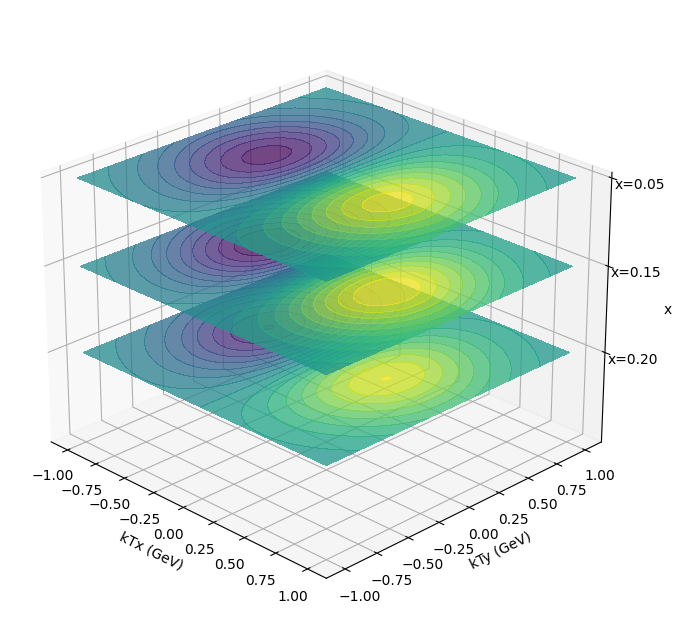

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.15, 0.20]

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Increase this value to separate the layers more
layer_distance = 2.5
offsets = np.arange(0, layer_distance * len(x_values), layer_distance)

for i, (x, offset) in enumerate(zip(x_values, offsets)):
    Z = np.array([[plot_function_u(x, 1, tx, ty) for tx, ty in zip(ktx, kty)] for ktx, kty in zip(X, Y)])
    ax.contourf(X, Y, Z + offset, zdir='z', offset=-i * layer_distance, cmap=cm.viridis, levels=20, alpha=0.75)

# Setting the limits and labels for better clarity and visibility
ax.set_xlabel('kTx (GeV)')
ax.set_ylabel('kTy (GeV)')
ax.set_zlabel('x')
ax.set_zlim(-len(x_values) * layer_distance, 0)

# Align the ticks to the middle of each slice
ax.set_zticks(-offsets)
ax.set_zticklabels([f"x={x_val:.2f}" for x_val in x_values])

# Optimal view
ax.view_init(elev=25, azim=-45)

plt.show()


parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

ValueError: The number of FixedLocator locations (4), usually from a call to set_ticks, does not match the number of labels (3).

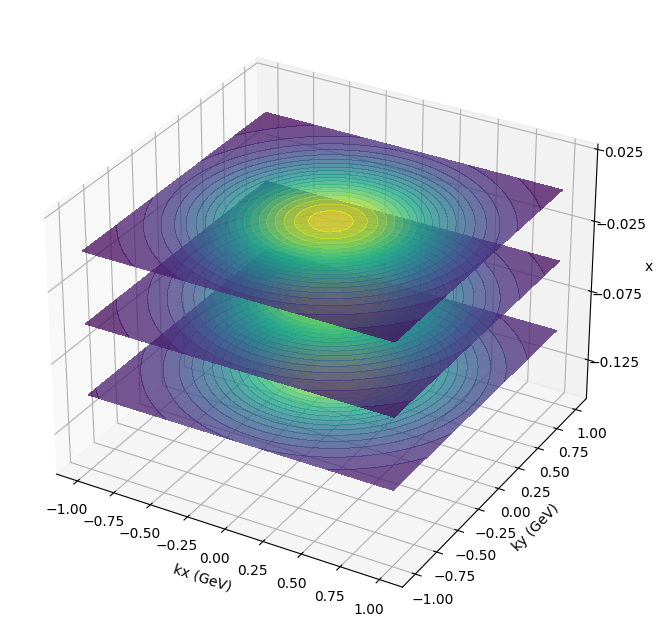

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / M * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.10, 0.15]

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Distance between layers
layer_distance = 0.05
offsets = np.arange(0, layer_distance * len(x_values), layer_distance)

for x, offset in zip(x_values, offsets):
    Z = np.array([[plot_function_u(x, 1, tx, ty) for tx, ty in zip(ktx, kty)] for ktx, kty in zip(X, Y)])
    ax.contourf(X, Y, Z + offset, zdir='z', offset=-offset, cmap=cm.viridis, levels=20, alpha=0.75)

# Setting the limits and labels for better clarity and visibility
ax.set_xlabel('kx (GeV)')
ax.set_ylabel('ky (GeV)')
ax.set_zlabel('x')
ax.set_zlim(-max(offsets), 0)

# Align the ticks to the middle of each slice
ax.set_zticks(-offsets + layer_distance / 2)
ax.set_zticklabels([f"x={x_val:.2f}" for x_val in x_values])

# Adjust the viewing angle
ax.view_init(elev=20, azim=-60)

# Add color bar
mappable = cm.ScalarMappable(cmap=cm.viridis)
mappable.set_array(Z)
cbar = plt.colorbar(mappable, shrink=0.5, aspect=5)
cbar.set_label('ρ(GeV$^{-2}$)')

plt.show()


parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

ValueError: The number of FixedLocator locations (4), usually from a call to set_ticks, does not match the number of labels (3).

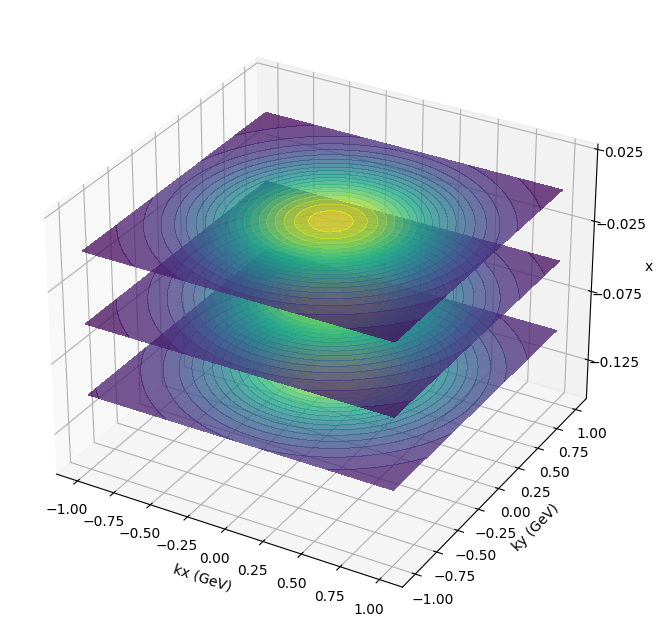

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / M * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.10, 0.15]

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Distance between layers
layer_distance = 0.05
offsets = np.arange(0, layer_distance * len(x_values), layer_distance)

for x, offset in zip(x_values, offsets):
    Z = np.array([[plot_function_u(x, 1, tx, ty) for tx, ty in zip(ktx, kty)] for ktx, kty in zip(X, Y)])
    ax.contourf(X, Y, Z + offset, zdir='z', offset=-offset, cmap=cm.viridis, levels=20, alpha=0.75)

# Setting the limits and labels for better clarity and visibility
ax.set_xlabel('kx (GeV)')
ax.set_ylabel('ky (GeV)')
ax.set_zlabel('x')
ax.set_zlim(-max(offsets), 0)

# Align the ticks to the middle of each slice
z_ticks = -offsets + layer_distance / 2
ax.set_zticks(z_ticks)
ax.set_zticklabels([f"x={x_val:.2f}" for x_val in x_values])

# Adjust the viewing angle
ax.view_init(elev=20, azim=-60)

# Add color bar
mappable = cm.ScalarMappable(cmap=cm.viridis)
mappable.set_array(Z)
cbar = plt.colorbar(mappable, shrink=0.5, aspect=5)
cbar.set_label('ρ(GeV$^{-2}$)')

plt.show()


parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

ValueError: The number of FixedLocator locations (4), usually from a call to set_ticks, does not match the number of labels (3).

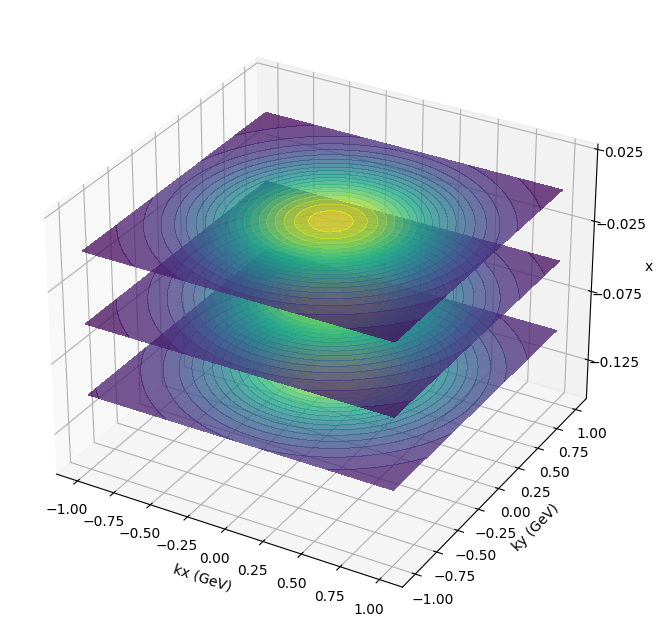

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / M * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.10, 0.15]

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Distance between layers
layer_distance = 0.05
offsets = np.arange(0, layer_distance * len(x_values), layer_distance)

for x, offset in zip(x_values, offsets):
    Z = np.array([[plot_function_u(x, 1, tx, ty) for tx, ty in zip(ktx, kty)] for ktx, kty in zip(X, Y)])
    ax.contourf(X, Y, Z + offset, zdir='z', offset=-offset, cmap=cm.viridis, levels=20, alpha=0.75)

# Setting the limits and labels for better clarity and visibility
ax.set_xlabel('kx (GeV)')
ax.set_ylabel('ky (GeV)')
ax.set_zlabel('x')
ax.set_zlim(-max(offsets), 0)

# Align the ticks to the middle of each slice
z_ticks = -offsets + layer_distance / 2
ax.set_zticks(z_ticks)
ax.set_zticklabels([f"x={x_val:.2f}" for x_val in x_values])

# Adjust the viewing angle
ax.view_init(elev=20, azim=-60)

# Add color bar
mappable = cm.ScalarMappable(cmap=cm.viridis)
mappable.set_array(Z)
cbar = plt.colorbar(mappable, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

plt.show()


parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

ValueError: The number of FixedLocator locations (4), usually from a call to set_ticks, does not match the number of labels (3).

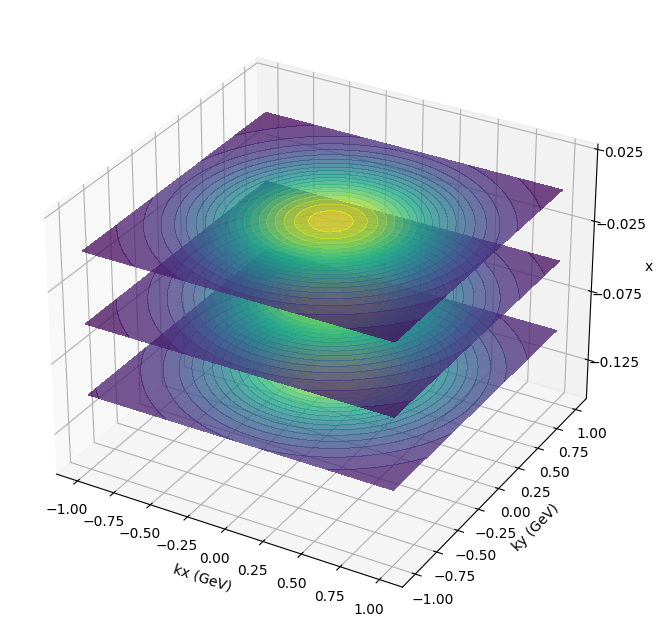

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / M * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.10, 0.15]

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Distance between layers
layer_distance = 0.05
offsets = np.arange(0, layer_distance * len(x_values), layer_distance)

for x, offset in zip(x_values, offsets):
    Z = np.array([[plot_function_u(x, 1, tx, ty) for tx, ty in zip(ktx, kty)] for ktx, kty in zip(X, Y)])
    ax.contourf(X, Y, Z + offset, zdir='z', offset=-offset, cmap=cm.viridis, levels=20, alpha=0.75)

# Setting the limits and labels for better clarity and visibility
ax.set_xlabel('kx (GeV)')
ax.set_ylabel('ky (GeV)')
ax.set_zlabel('x')
ax.set_zlim(-max(offsets), 0)

# Align the ticks to the middle of each slice
z_ticks = -offsets + layer_distance / 2
ax.set_zticks(z_ticks)
ax.set_zticklabels([f"x={x_val:.2f}" for x_val in x_values])

# Adjust the viewing angle
ax.view_init(elev=20, azim=-60)

# Add color bar
mappable = cm.ScalarMappable(cmap=cm.viridis)
mappable.set_array(Z)
cbar = plt.colorbar(mappable, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

plt.show()


parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

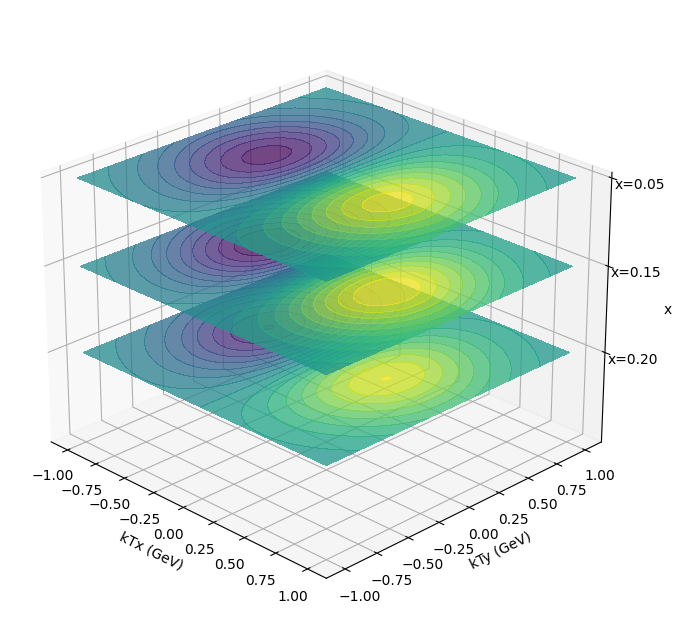

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.15, 0.20]

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Increase this value to separate the layers more
layer_distance = 2.5
offsets = np.arange(0, layer_distance * len(x_values), layer_distance)

for i, (x, offset) in enumerate(zip(x_values, offsets)):
    Z = np.array([[plot_function_u(x, 1, tx, ty) for tx, ty in zip(ktx, kty)] for ktx, kty in zip(X, Y)])
    ax.contourf(X, Y, Z + offset, zdir='z', offset=-i * layer_distance, cmap=cm.viridis, levels=20, alpha=0.75)

# Setting the limits and labels for better clarity and visibility
ax.set_xlabel('kTx (GeV)')
ax.set_ylabel('kTy (GeV)')
ax.set_zlabel('x')
ax.set_zlim(-len(x_values) * layer_distance, 0)

# Align the ticks to the middle of each slice
ax.set_zticks(-offsets)
ax.set_zticklabels([f"x={x_val:.2f}" for x_val in x_values])

# Optimal view
ax.view_init(elev=25, azim=-45)

plt.show()


parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

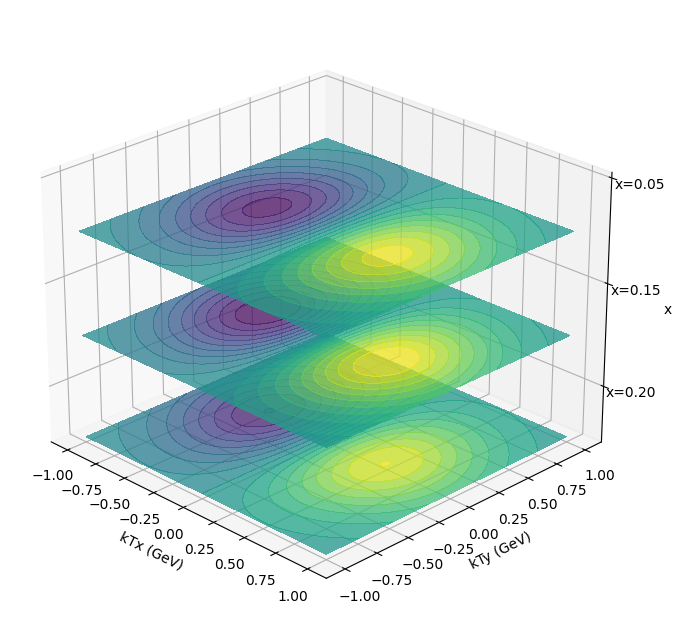

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.15, 0.20]

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Increase this value to separate the layers more
layer_distance = 20.5  # Adjusted significantly for better separation
offsets = np.arange(0, layer_distance * len(x_values), layer_distance)

for x, offset in zip(x_values, offsets):
    Z = np.array([[plot_function_u(x, 1, tx, ty) for tx, ty in zip(ktx, kty)] for ktx, kty in zip(X, Y)])
    ax.contourf(X, Y, Z + offset, zdir='z', offset=-offset, cmap=cm.viridis, levels=20, alpha=0.75)

# Setting the limits and labels for better clarity and visibility
ax.set_xlabel('kTx (GeV)')
ax.set_ylabel('kTy (GeV)')
ax.set_zlabel('x')
ax.set_zlim(-max(offsets), 0)

# Align the ticks to the middle of each slice
ax.set_zticks(-offsets + layer_distance / 2)
ax.set_zticklabels([f"x={x_val:.2f}" for x_val in x_values])

# Optimal view
ax.view_init(elev=25, azim=-45)

plt.show()


adding differntiation


In [ ]:
x=0.1
Q2=10.0
kT=0.1
irep = 0 # this one can be varied in order to create multiple images
def plot_function_u(irep,x,Q2,kTx,kTy):
  kT = np.sqrt(kTx**2 + kTy**2)
  return tmd.eval(x,Q2,kT,'p','pdf',irep,icol=False)[1] - kTx/M * tmd.eval(x,Q2,kT,'p','sivers',irep,icol=False)[1]
kTx,kTy = 0.1,0.1
print(plot_function_u(irep,x,Q2,kTx,kTy))


3.6289868535276097


(32, 32, 9)


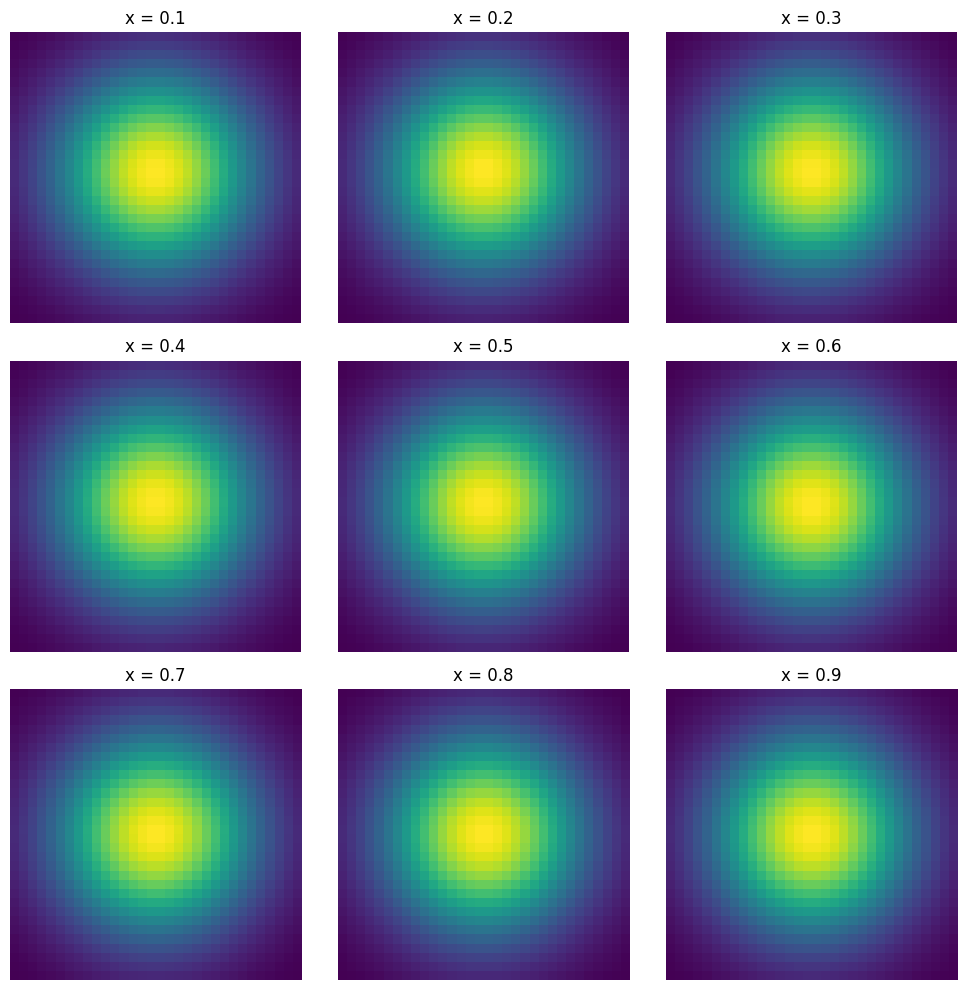

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

from matplotlib.colors import Normalize
import matplotlib.cm as cm

kTx = np.linspace(-1,1,32)
kTy = np.linspace(-1,1,32)
X, Y = np.meshgrid(kTx, kTy)

Z=[]
x = 0.1
Q2 = 10

irep = 0 # this can be changed to produce replicas of images, can be from 0 to 465
for kx in kTx:
  Z1 = []
  for ky in kTy:
        Z2 = []
        for x in range(1,10):
            Z2.append(plot_function_u(irep, x/10, Q2, kx, ky))
        Z1.append(Z2)
  Z.append(Z1)
ND = np.array(Z)
print(ND.shape)

# Plotting 2D slices
fig, axs = plt.subplots(3, 3, figsize=(10, 10))

for i in range(3):
    for j in range(3):
        ax = axs[i, j]
        ax.imshow(ND[:, :, i*3+j], cmap='viridis', interpolation='nearest', origin='lower')
        ax.set_title(f'x = {(i*3+j+1)/10}')
        ax.axis('off')


plt.tight_layout()
plt.show()

# example = plt.imshow(ND[:, :, 0], cmap='viridis', interpolation='none', origin='lower')
# print(example.shape)

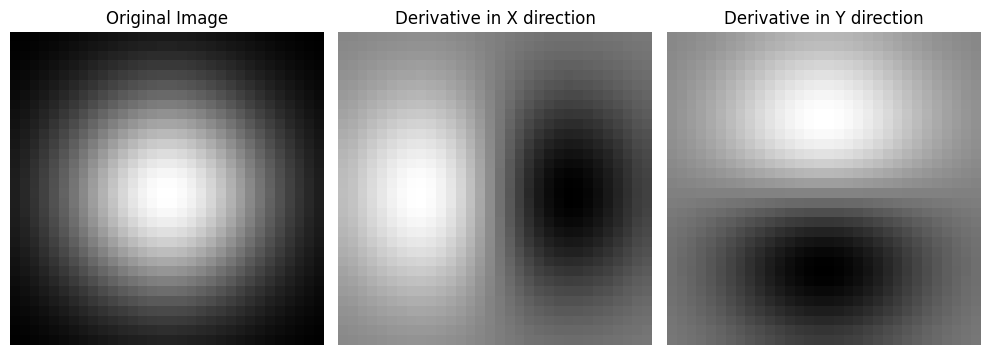

In [ ]:
image_gray = ND[:, :, 0]

# Compute derivatives using NumPy gradient function
dx = np.gradient(image_gray, axis=1)  # Derivative in x-direction
dy = np.gradient(image_gray, axis=0)

import numpy as np
import matplotlib.pyplot as plt

# Generate a sample grayscale image for demonstration
image = ND[:, :, 0]  # Example 256x256 grayscale image

# Compute derivatives using NumPy gradient function
dx = np.gradient(image, axis=1)  # Derivative in x-direction
dy = np.gradient(image, axis=0)  # Derivative in y-direction

# Visualize the original image and its derivatives
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray',interpolation='none')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(dx, cmap='gray',interpolation='none')
plt.title('Derivative in X direction')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(dy, cmap='gray',interpolation='none')
plt.title('Derivative in Y direction')
plt.axis('off')

plt.tight_layout()
plt.show()

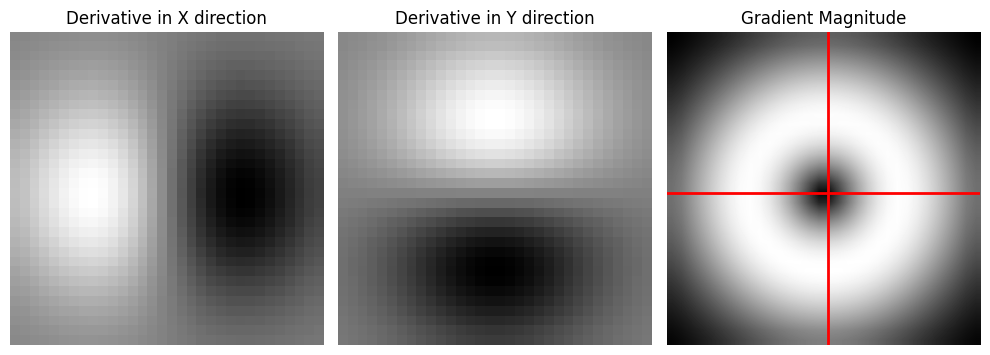

In [ ]:
# Compute magnitude of gradients
magnitude = np.sqrt(dx**2 + dy**2)

# Normalize magnitude to [0, 255]
magnitude = (magnitude / np.max(magnitude)) * 255

# Create a figure
plt.figure(figsize=(10, 5))

# Plot derivative in X direction
plt.subplot(1, 3, 1)
plt.imshow(dx, cmap='gray')
plt.title('Derivative in X direction')
plt.axis('off')

# Plot derivative in Y direction
plt.subplot(1, 3, 2)
plt.imshow(dy, cmap='gray')
plt.title('Derivative in Y direction')
plt.axis('off')

# Plot gradient magnitude with a crosshair in the center
plt.subplot(1, 3, 3)
plt.imshow(magnitude, cmap='gray',interpolation='bilinear')
plt.title('Gradient Magnitude')
plt.axis('off')

# Add a crosshair in the center
center_x = magnitude.shape[1] // 2
center_y = magnitude.shape[0] // 2
marker_size = 32

# Horizontal line (crosshair)
plt.axhline(center_y, color='red', linewidth=2)

# Vertical line (crosshair)
plt.axvline(center_x, color='red', linewidth=2)

plt.tight_layout()
plt.show()

<ipython-input-18-76e65da4d963>:93: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.

<ipython-input-18-76e65da4d963>:99: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



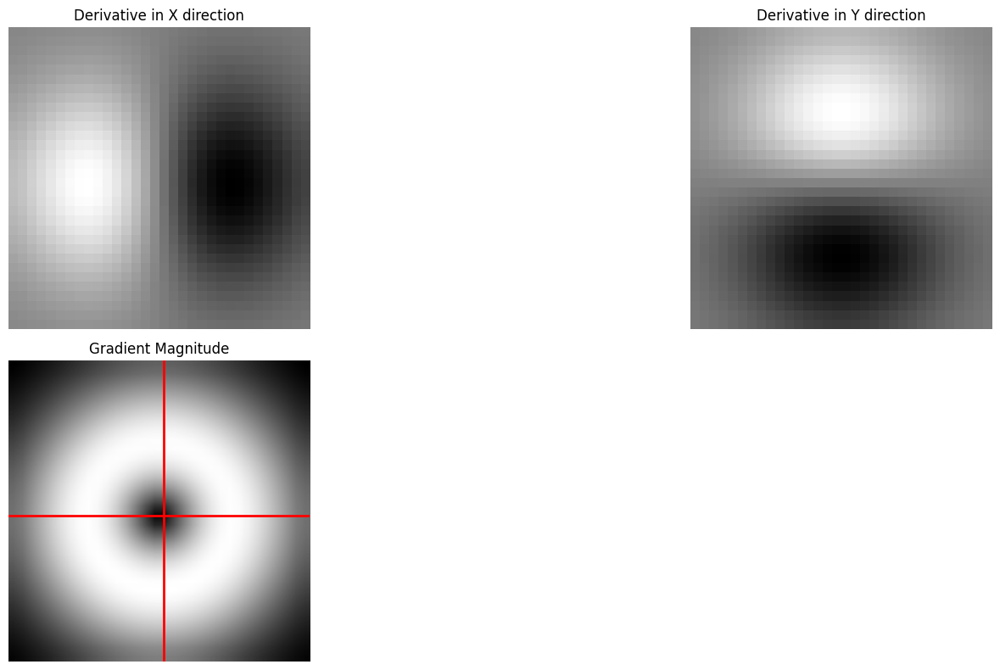

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(18, 8))

# 3D plot
ax1 = fig.add_subplot(121, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax1.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False)
    ax1.contour(X, Y, Z[i], zdir='z', offset=-0.02*i, cmap='viridis')

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, ax=ax1, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax1.set_xlabel(r'$k_x$ (GeV)')
ax1.set_ylabel(r'$k_y$ (GeV)')
ax1.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax1.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

# Gradient visualization for the first slice
image_gray = Z[0]

# Compute derivatives using NumPy gradient function
dx = np.gradient(image_gray, axis=1)  # Derivative in x-direction
dy = np.gradient(image_gray, axis=0)  # Derivative in y-direction

# Compute magnitude of gradients
magnitude = np.sqrt(dx**2 + dy**2)

# Normalize magnitude to [0, 255]
magnitude = (magnitude / np.max(magnitude)) * 255

# Plot gradient visualization
ax2 = fig.add_subplot(122)

# Plot derivative in X direction
plt.subplot(2, 2, 1)
plt.imshow(dx, cmap='gray', interpolation='none')
plt.title('Derivative in X direction')
plt.axis('off')

# Plot derivative in Y direction
plt.subplot(2, 2, 2)
plt.imshow(dy, cmap='gray', interpolation='none')
plt.title('Derivative in Y direction')
plt.axis('off')

# Plot gradient magnitude with a crosshair in the center
plt.subplot(2, 2, 3)
plt.imshow(magnitude, cmap='gray', interpolation='bilinear')
plt.title('Gradient Magnitude')
plt.axis('off')

# Add a crosshair in the center
center_x = magnitude.shape[1] // 2
center_y = magnitude.shape[0] // 2

# Horizontal line (crosshair)
plt.axhline(center_y, color='red', linewidth=2)

# Vertical line (crosshair)
plt.axvline(center_x, color='red', linewidth=2)

plt.tight_layout()
plt.show()


<ipython-input-19-3f586080884c>:68: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

<ipython-input-19-3f586080884c>:106: UserWarning:

tight_layout not applied: number of columns in subplot specifications must be multiples of one another.



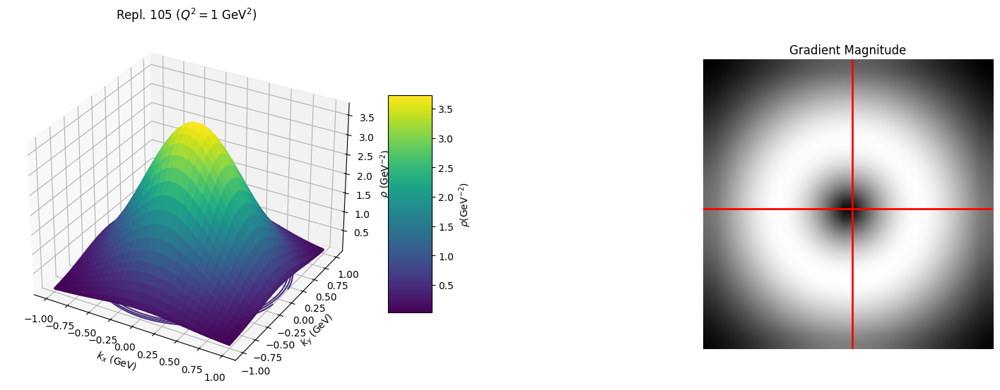

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]
    # return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(18, 8))

# 3D Plot
ax = fig.add_subplot(121, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False)
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.02*i, cmap='viridis')

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

# Gradient Visualization
image_gray = Z[0]  # Using the first slice for gradient visualization

# Compute derivatives using NumPy gradient function
dx = np.gradient(image_gray, axis=1)  # Derivative in x-direction
dy = np.gradient(image_gray, axis=0)  # Derivative in y-direction

# Compute magnitude of gradients
magnitude = np.sqrt(dx**2 + dy**2)

# Normalize magnitude to [0, 255]
magnitude = (magnitude / np.max(magnitude)) * 255

# Gradient visualization
plt.subplot(1, 3, 3)
plt.imshow(magnitude, cmap='gray', interpolation='bilinear')
plt.title('Gradient Magnitude')
plt.axis('off')

# Add a crosshair in the center
center_x = magnitude.shape[1] // 2
center_y = magnitude.shape[0] // 2

# Horizontal line (crosshair)
plt.axhline(center_y, color='red', linewidth=2)

# Vertical line (crosshair)
plt.axvline(center_x, color='red', linewidth=2)

plt.tight_layout()
plt.show()


<ipython-input-20-d709b86094f0>:84: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



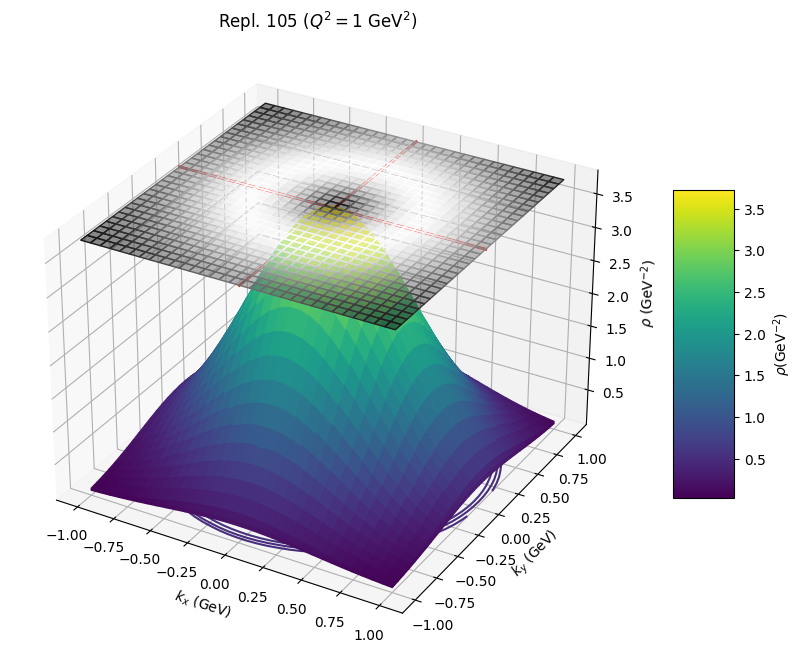

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False)
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.02*i, cmap='viridis')

# Compute gradients and magnitude
image_gray = Z[0]  # Using the first slice for gradient visualization
dx = np.gradient(image_gray, axis=1)  # Derivative in x-direction
dy = np.gradient(image_gray, axis=0)  # Derivative in y-direction
magnitude = np.sqrt(dx**2 + dy**2)
magnitude = (magnitude / np.max(magnitude)) * 255

# Overlay gradient magnitude as a surface plot
Z_offset = np.full_like(X, np.max(Z) + 0.05)  # Offset above the highest point of the 3D plot

ax.plot_surface(X, Y, Z_offset, rstride=1, cstride=1, facecolors=cm.gray(magnitude / 255), alpha=0.5, shade=False)

# Add crosshair on the gradient magnitude
center_x = magnitude.shape[1] // 2
center_y = magnitude.shape[0] // 2

ax.plot([kTx[center_x], kTx[center_x]], [kTy[0], kTy[-1]], [Z_offset[0, 0], Z_offset[0, 0]], color='red', linewidth=2)
ax.plot([kTx[0], kTx[-1]], [kTy[center_y], kTy[center_y]], [Z_offset[0, 0], Z_offset[0, 0]], color='red', linewidth=2)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

plt.show()


<ipython-input-26-cd5d3e674cac>:85: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


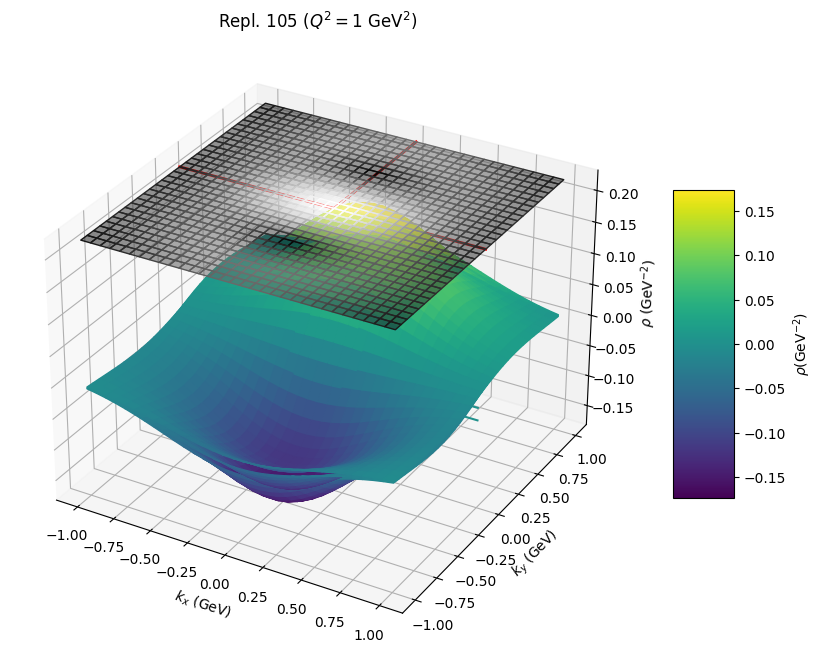

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    # return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False)
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.02*i, cmap='viridis')

# Compute gradients and magnitude
image_gray = Z[0]  # Using the first slice for gradient visualization
dx = np.gradient(image_gray, axis=1)  # Derivative in x-direction
dy = np.gradient(image_gray, axis=0)  # Derivative in y-direction
magnitude = np.sqrt(dx**2 + dy**2)
magnitude = (magnitude / np.max(magnitude)) * 255

# Overlay gradient magnitude as a surface plot
Z_offset = np.full_like(X, np.max(Z) + 0.05)  # Offset above the highest point of the 3D plot

ax.plot_surface(X, Y, Z_offset, rstride=1, cstride=1, facecolors=cm.gray(magnitude / 255), alpha=0.5, shade=False)

# Add crosshair on the gradient magnitude
center_x = magnitude.shape[1] // 2
center_y = magnitude.shape[0] // 2

ax.plot([kTx[center_x], kTx[center_x]], [kTy[0], kTy[-1]], [Z_offset[0, 0], Z_offset[0, 0]], color='red', linewidth=2)
ax.plot([kTx[0], kTx[-1]], [kTy[center_y], kTy[center_y]], [Z_offset[0, 0], Z_offset[0, 0]], color='red', linewidth=2)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

plt.show()




In [ ]:
Just contour plot on the top

<ipython-input-21-4a189d3cc5d3>:71: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



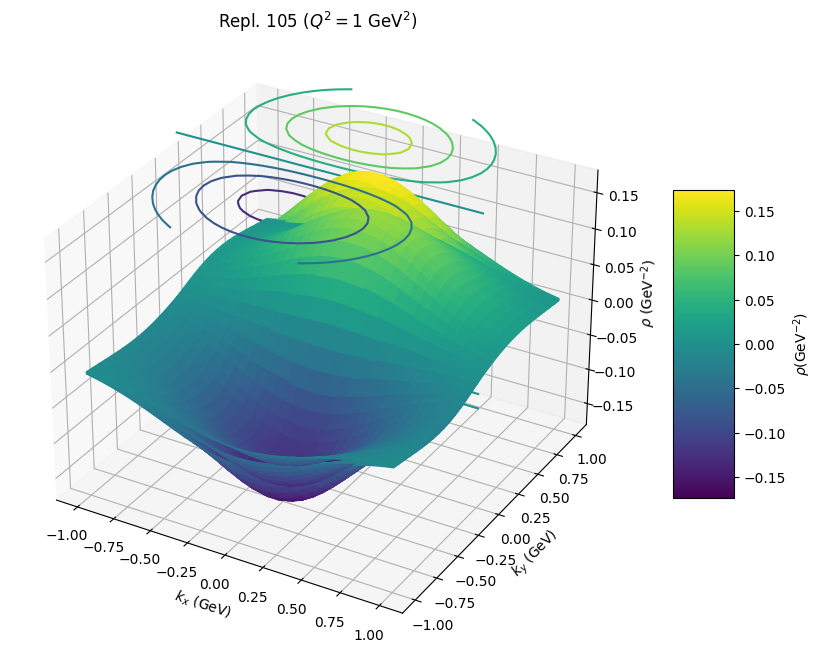

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    # return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False)
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.02*i, cmap='viridis')

# Overlay contour plot on top
Z_offset = np.full_like(X, np.max(Z) + 0.05)  # Offset above the highest point of the 3D plot

ax.contour(X, Y, Z[0], zdir='z', offset=np.max(Z) + 0.05, cmap='viridis')

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

plt.show()


<ipython-input-22-c92484eacc7c>:72: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



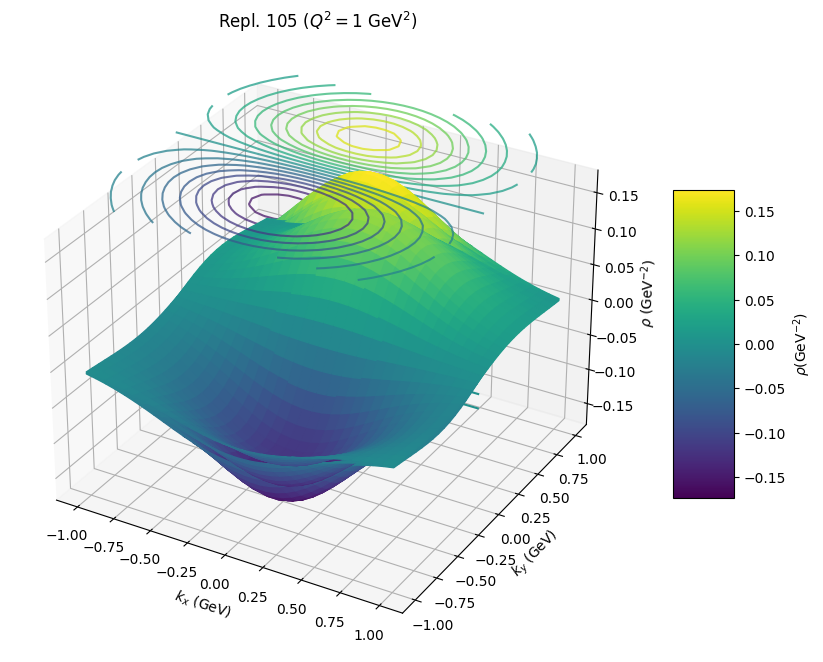

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    # return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False)
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.02*i, cmap='viridis')

# Overlay contour plot on top
Z_offset = np.full_like(X, np.max(Z) + 0.05)  # Offset above the highest point of the 3D plot

# Increase number of levels for clarity
ax.contour(X, Y, Z[0], zdir='z', offset=np.max(Z) + 0.05, cmap='viridis', alpha=0.75, levels=20)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

plt.show()


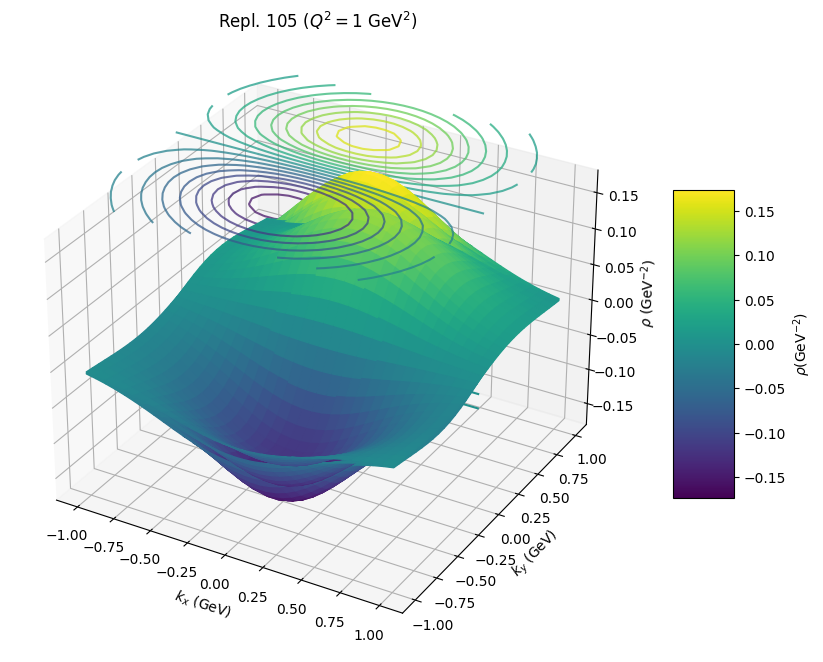

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize

# Importing necessary modules and configurations
# sys.path.append('/content/jam3d_dev_lib')
# sys.path.append('/content/jam3dlib')
# os.environ["JAM3D"] = "/content/jam3d_dev_lib"
# from tools.tools import checkdir, save, load, lprint
# import tools.config
# from tools.config import load_config, conf
# from tmd import TMD

# Initialize TMD
# tag = 'JAM3D_2022'
# tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    # return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]
    return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 32)
kTy = np.linspace(-1, 1, 32)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.1, 0.2, 3)  # we can adjust as needed to match the range and number of x slices in the provided image
Q2 = 10.0
irep = 0  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.viridis(norm(Z))

# Plotting the data
for i, x in enumerate(x_values):
    ax.plot_surface(X, Y, Z[i], rstride=1, cstride=1, facecolors=colors[i], shade=False)
    ax.contour(X, Y, Z[i], zdir='z', offset=-0.02*i, cmap='viridis')

# Overlay contour plot on top
Z_offset = np.full_like(X, np.max(Z) + 0.05)  # Offset above the highest point of the 3D plot

# Increase number of levels for clarity
ax.contour(X, Y, Z[0], zdir='z', offset=np.max(Z) + 0.05, cmap='viridis', alpha=0.75, levels=20)

# Adding color bars
m = cm.ScalarMappable(cmap=cm.viridis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, ax=ax, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$k_x$ (GeV)')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$\rho$ (GeV$^{-2}$)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

plt.show()


parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

<ipython-input-10-8683627694cb>:55: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


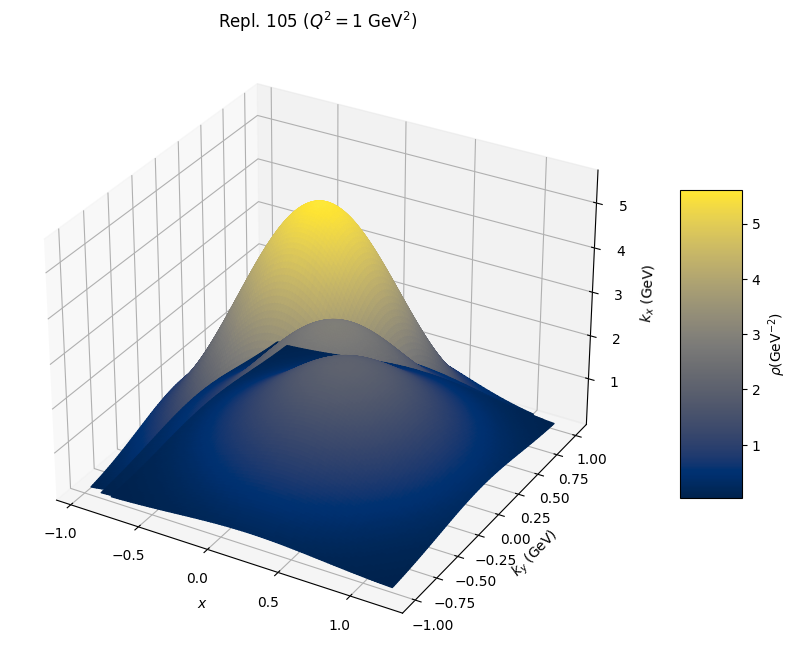

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize
from tmd import TMD

# Initialize TMD
tag = 'JAM3D_2022'
tmd = TMD(tag)

# Function to calculate plot function values
def plot_function_u(irep, x, Q2, kTx, kTy):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Setting up the variables
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = np.linspace(0.05, 0.20, 3)  # Adjust as needed to match the range and number of x slices in the provided image
Q2 = 1.0
irep = 105  # Choose a specific replica

# Generating the data
Z = []
for x in x_values:
    Z_slice = []
    for kx in kTx:
        Z_row = []
        for ky in kTy:
            Z_row.append(plot_function_u(irep, x, Q2, kx, ky))
        Z_slice.append(Z_row)
    Z.append(Z_slice)

# Converting list to numpy array for better handling
Z = np.array(Z)

# Plotting the figures
fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a color map
norm = Normalize(vmin=Z.min(), vmax=Z.max())
colors = cm.cividis(norm(Z))

# Plotting the data
for i, (x, z) in enumerate(zip(x_values, Z)):
    x_offset = x  # Offset for x-axis based on x value
    ax.plot_surface(X + x_offset, Y, z, rstride=1, cstride=1, facecolors=colors[i], shade=False)

# Adding color bar
m = cm.ScalarMappable(cmap=cm.cividis, norm=norm)
m.set_array(Z)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$k_x$ (GeV)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

plt.show()


parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

<ipython-input-11-e05ceaa19dd4>:39: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


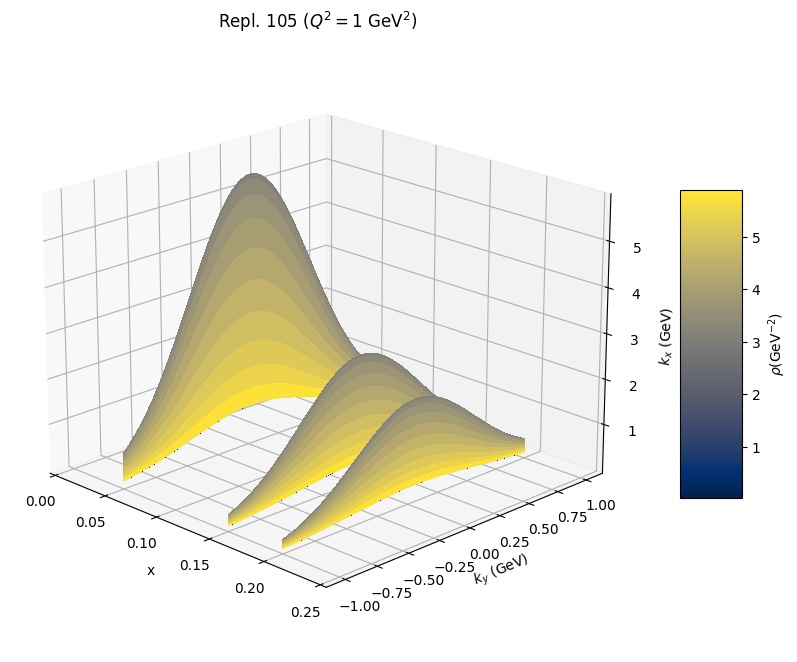

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / M * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.15, 0.20]

fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection='3d')

# Normalize the color scale based on all slices
Z_all = np.array([[[plot_function_u(x, 1, tx, ty) for ty in kTy] for tx in kTx] for x in x_values])
norm = Normalize(vmin=Z_all.min(), vmax=Z_all.max())
colors = cm.cividis(norm(Z_all))

# Plot each slice
for i, (x, z) in enumerate(zip(x_values, Z_all)):
    z_offset = -x  # Offset for z-axis based on x value
    ax.contourf(X, Y, z, zdir='x', offset=x, cmap=cm.cividis, levels=20)

# Adding color bar
m = cm.ScalarMappable(cmap=cm.cividis, norm=norm)
m.set_array(Z_all)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel('x')
ax.set_xlim(x_values[0] - 0.05, x_values[-1] + 0.05)
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$k_x$ (GeV)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

# Adjust viewing angle
ax.view_init(elev=20, azim=-45)

plt.show()


parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

<ipython-input-10-5f656256578c>:39: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


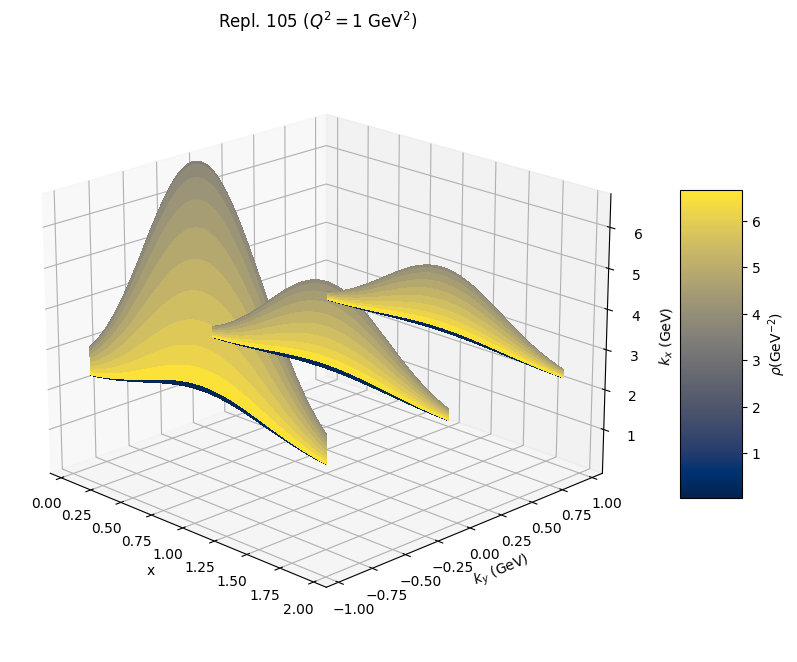

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / M * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.15, 0.20]

fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection='3d')

# Normalize the color scale based on all slices
Z_all = np.array([[[plot_function_u(x, 10, tx, ty) for ty in kTy] for tx in kTx] for x in x_values])
norm = Normalize(vmin=Z_all.min(), vmax=Z_all.max())
colors = cm.cividis(norm(Z_all))

# Plot each slice
for i, (x, z) in enumerate(zip(x_values, Z_all)):
    z_offset = -x  # Offset for z-axis based on x value
    ax.contourf(X, Y, z, zdir='y', offset=i, cmap=cm.cividis, levels=20)

# Adding color bar
m = cm.ScalarMappable(cmap=cm.cividis, norm=norm)
m.set_array(Z_all)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel('x')
ax.set_xlim(-0.05, len(x_values) - 1 + 0.05)
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$k_x$ (GeV)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

# Adjust viewing angle
ax.view_init(elev=20, azim=-45)

plt.show()


parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

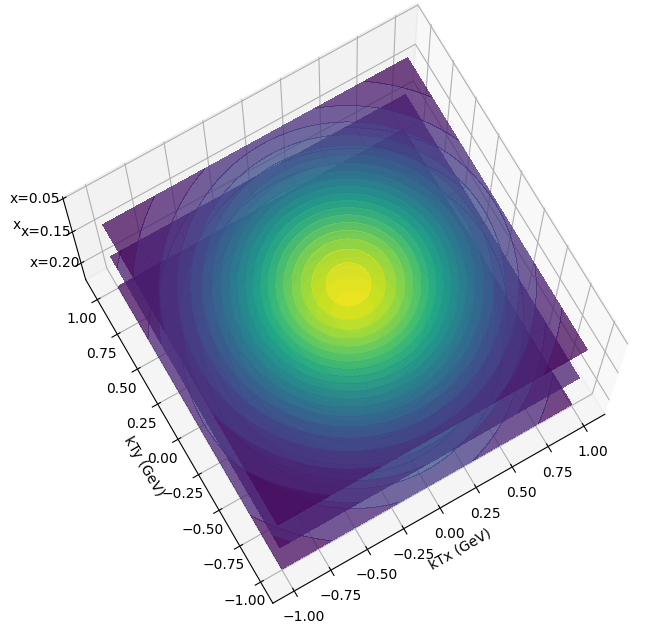

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

    # return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.15, 0.20]

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Increase this value to separate the layers more
layer_distance = 20.5
offsets = np.arange(0, layer_distance * len(x_values), layer_distance)

for x, offset in zip(x_values, offsets):
    Z = np.array([[plot_function_u(x, 1, tx, ty) for tx, ty in zip(ktx, kty)] for ktx, kty in zip(X, Y)])
    ax.contourf(X, Y, Z + offset, zdir='z', offset=-offset, cmap=cm.viridis, levels=20, alpha=0.75)

# Setting the limits and labels for better clarity and visibility
ax.set_xlabel('kTx (GeV)')
ax.set_ylabel('kTy (GeV)')
ax.set_zlabel('x')
ax.set_zlim(-max(offsets), 0)

# Align the ticks to the middle of each slice
ax.set_zticks(-offsets + layer_distance / 2)
ax.set_zticklabels([f"x={x_val:.2f}" for x_val in x_values])

# Optimal view
ax.view_init(elev=75, azim = -120)

plt.show()


parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

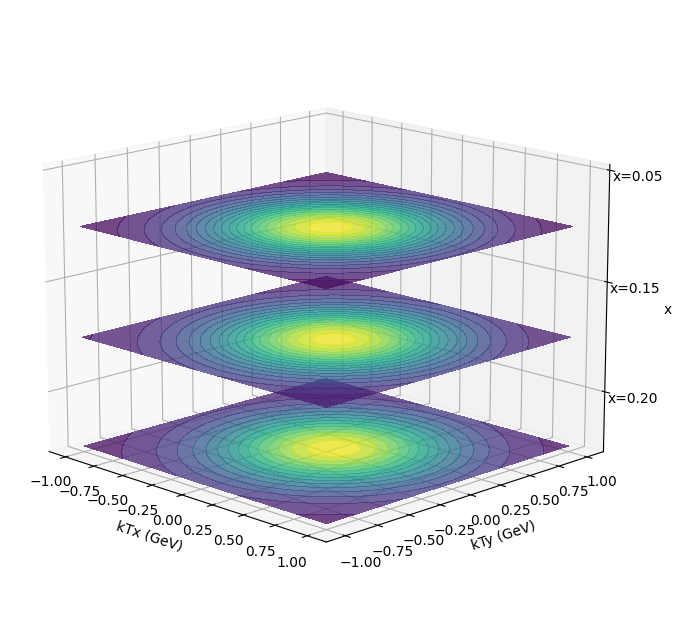

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

    # return - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.15, 0.20]

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Increase this value to separate the layers more
layer_distance = 20.5
offsets = np.arange(0, layer_distance * len(x_values), layer_distance)

for x, offset in zip(x_values, offsets):
    Z = np.array([[plot_function_u(x, 1, tx, ty) for tx, ty in zip(ktx, kty)] for ktx, kty in zip(X, Y)])
    ax.contourf(X, Y, Z + offset, zdir='z', offset=-offset, cmap=cm.viridis, levels=20, alpha=0.75)

# Setting the limits and labels for better clarity and visibility
ax.set_xlabel('kTx (GeV)')
ax.set_ylabel('kTy (GeV)')
ax.set_zlabel('x')
ax.set_zlim(-max(offsets), 0)

# Align the ticks to the middle of each slice
ax.set_zticks(-offsets + layer_distance / 2)
ax.set_zticklabels([f"x={x_val:.2f}" for x_val in x_values])

# Optimal view
ax.view_init(elev=15, azim=-45)

plt.show()


parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

<ipython-input-19-4076212d55bb>:42: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


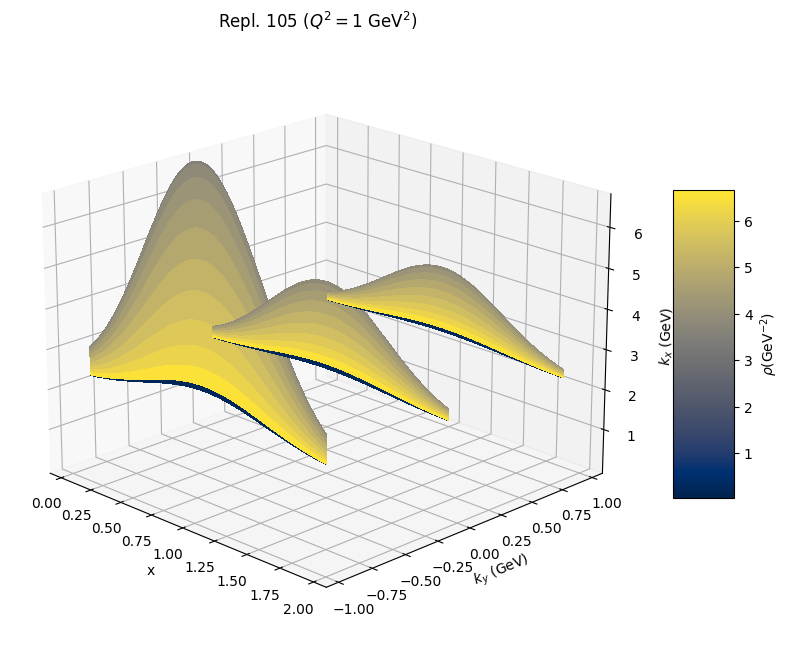

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.15, 0.20]

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Normalize the color scale based on all slices
Z_all = np.array([[[plot_function_u(x, 10, tx, ty) for ty in kTy] for tx in kTx] for x in x_values])
norm = Normalize(vmin=Z_all.min(), vmax=Z_all.max())
colors = cm.cividis(norm(Z_all))

# Use the desired colormap
cmap = cm.cividis

# Plot each slice
for i, (x, z) in enumerate(zip(x_values, Z_all)):
    z_offset = -x  # Offset for z-axis based on x value
    ax.contourf(X, Y, z, zdir='y', offset=i, cmap=cmap, levels=20)

# Adding color bar
m = cm.ScalarMappable(cmap=cmap, norm=norm)
m.set_array(Z_all)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel('x')
ax.set_xlim(-0.05, len(x_values) - 1 + 0.05)
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$k_x$ (GeV)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

# Adjust viewing angle
ax.view_init(elev=20, azim=-45)

plt.show()


parman: pdf
order: [1, 'pdf', 'widths1_uv']
order: [1, 'pdf', 'widths1_sea']
parman: pdfpi-
parman: ffpi
order: [1, 'ffpi', 'widths1_fav']
order: [1, 'ffpi', 'widths1_ufav']
parman: ffk
order: [1, 'ffk', 'widths1_fav']
order: [1, 'ffk', 'widths1_ufav']
parman: ffh
parman: transversity
order: [1, 'transversity', 'widths1_uv']
order: [1, 'transversity', 'u N0 1']
order: [1, 'transversity', 'u N1 1']
order: [1, 'transversity', 'u a0 1']
order: [1, 'transversity', 'u b0 1']
order: [1, 'transversity', 'u b1 1']
order: [1, 'transversity', 'd N0 1']
order: [1, 'transversity', 'd N1 1']
order: [1, 'transversity', 'd a0 1']
parman: collinspi
order: [1, 'collinspi', 'widths1_fav']
order: [1, 'collinspi', 'widths1_ufav']
order: [1, 'collinspi', 'u N0 1']
order: [1, 'collinspi', 'u N1 1']
order: [1, 'collinspi', 'u a0 1']
order: [1, 'collinspi', 'u a1 1']
order: [1, 'collinspi', 'u b0 1']
order: [1, 'collinspi', 'u b1 1']
order: [1, 'collinspi', 'u b0 2']
order: [1, 'collinspi', 'u b1 2']
order: [

<ipython-input-20-f33eba769276>:39: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m, shrink=0.5, aspect=5)


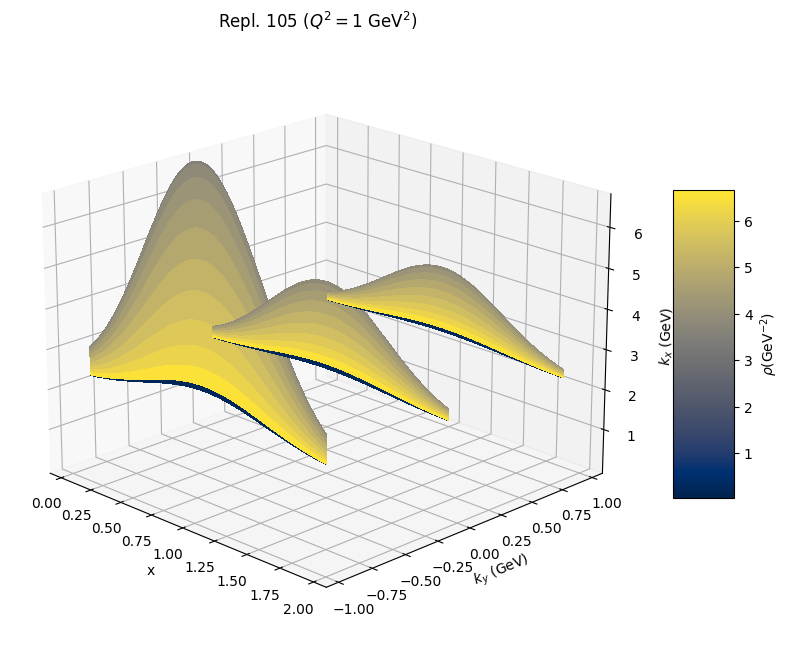

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize
from tmd import TMD

# Initialize the TMD model
tag = 'JAM3D_2022'
tmd = TMD(tag)
M = 0.938  # Proton mass in GeV

def plot_function_u(x, Q2, kTx, kTy, irep=0):
    kT = np.sqrt(kTx**2 + kTy**2)
    return tmd.eval(x, Q2, kT, 'p', 'pdf', irep, icol=False)[1] - kTx / 0.93891897 * tmd.eval(x, Q2, kT, 'p', 'sivers', irep, icol=False)[1]

# Meshgrid for kT components
kTx = np.linspace(-1, 1, 100)
kTy = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(kTx, kTy)
x_values = [0.05, 0.15, 0.20]

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Create a color map and normalize based on all slices
Z_all = np.array([[[plot_function_u(x, 10, tx, ty) for ty in kTy] for tx in kTx] for x in x_values])
norm = Normalize(vmin=Z_all.min(), vmax=Z_all.max())
cmap = cm.cividis

# Plot each slice
for i, (x, z) in enumerate(zip(x_values, Z_all)):
    z_offset = -x  # Offset for z-axis based on x value
    ax.contourf(X, Y, z, zdir='y', offset=i, cmap=cmap, levels=20)

# Adding color bar
m = cm.ScalarMappable(cmap=cmap, norm=norm)
m.set_array(Z_all)
cbar = plt.colorbar(m, shrink=0.5, aspect=5)
cbar.set_label(r'$\rho$(GeV$^{-2}$)')

# Labels and title
ax.set_xlabel('x')
ax.set_xlim(-0.05, len(x_values) - 1 + 0.05)
ax.set_ylabel(r'$k_y$ (GeV)')
ax.set_zlabel(r'$k_x$ (GeV)')
ax.set_title(r'Repl. 105 ($Q^2=1$ GeV$^2$)')

# Adjust viewing angle
ax.view_init(elev=20, azim=-45)

plt.show()
